# Air Quality Forecating

## Time Series Forecasting 

- Time series forecasting is nothing but predicting future events by analyzing past trends, based on the assumption that future trends will hold similar to historical trends. Forecasting involves using models fit on historical data to predict future values. Forecasting involves using models fit on historical data to predict future values. Prediction problems that involve a time component require time series forecasting, which provides a data-driven approach to effective and efficient planning.

## Methods of Time Series Forecasting

- __Autoregressive (AR)__ – An autoregressive (AR) model predicts future behavior based on past behavior. It is used to forecast   when there is some correlation between the values of a time series and the values that precede and follow them.

- __Exponential Smoothing (ES)__ – Exponential smoothing is a time series forecasting method for univariate data that can be extended to support data with a systematic trend or seasonal component.

- __Autoregressive Integrated Moving Average (ARIMA)__ – Autoregressive Integrated Moving Average, ARIMA, models are among the most widely used approaches to time series forecasting. Actually, it is a class of models that 'explains' a given time series based on its own past values.

- __Seasonal Autoregressive Integrated Moving Average (SARIMA)__ – Seasonal Autoregressive Integrated Moving Average  (SARIMA) models extend the basic ARIMA models and allow the incorporation of seasonal patterns.

- __Prophet__ – Prophet, which was released by Facebook's Core Data Science team, is an open source library developed by      Facebook and designed for automated forecasting of univariate time series data.

- __LSTM__ – Long Short-Term Memory (LSTM) is a type of recurrent neural network that can learn the order dependency between elements in a sequence. It is often used to solve time series forecasting problems.

- __GRU__ - GRU architecture is similar to LSTM as they both have gates that control the flow of data within the unit and they are dissimilar as GRU has fewer cells allowing less computation and easier implementation.


## Data Exploration and Analysis

In [ ]:
#Importing relavant libraries

import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import os
import seaborn as sb

In [ ]:
#Importing dataset

df = pd.read_csv('dataset.csv')

In [ ]:
df.head(10)

,City,Datetime,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01 01:00:00,NaN,NaN,1.00,40.01,36.37,NaN,1.00,122.07,NaN,0.0,0.0,0.0,NaN,NaN
1,Ahmedabad,2015-01-01 02:00:00,NaN,NaN,0.02,27.75,19.73,NaN,0.02,85.90,NaN,0.0,0.0,0.0,NaN,NaN
2,Ahmedabad,2015-01-01 03:00:00,NaN,NaN,0.08,19.32,11.08,NaN,0.08,52.83,NaN,0.0,0.0,0.0,NaN,NaN
3,Ahmedabad,2015-01-01 04:00:00,NaN,NaN,0.30,16.45,9.20,NaN,0.30,39.53,153.58,0.0,0.0,0.0,NaN,NaN
4,Ahmedabad,2015-01-01 05:00:00,NaN,NaN,0.12,14.90,7.85,NaN,0.12,32.63,NaN,0.0,0.0,0.0,NaN,NaN
5,Ahmedabad,2015-01-01 06:00:00,NaN,NaN,0.33,15.95,10.82,NaN,0.33,29.87,64.25,0.0,0.0,0.0,NaN,NaN
6,Ahmedabad,2015-01-01 07:00:00,NaN,NaN,0.45,15.94,12.47,NaN,0.45,27.41,191.96,0.0,0.0,0.0,NaN,NaN
7,Ahmedabad,2015-01-01 08:00:00,NaN,NaN,1.03,16.66,16.48,NaN,1.03,20.92,177.21,0.0,0.0,0.0,NaN,NaN
8,Ahmedabad,2015-01-01 09:00:00,NaN,NaN,1.47,16.25,18.02,NaN,1.47,16.45,122.08,0.0,0.0,0.0,NaN,NaN
9,Ahmedabad,2015-01-01 10:00:00,NaN,NaN,2.05,13.78,16.08,NaN,2.05,15.14,NaN,0.0,0.0,0.0,NaN,NaN


In [ ]:
df.shape[0]

707875

In [ ]:
df.dtypes

City           object
Datetime       object
PM2.5         float64
PM10          float64
NO            float64
NO2           float64
NOx           float64
NH3           float64
CO            float64
SO2           float64
O3            float64
Benzene       float64
Toluene       float64
Xylene        float64
AQI           float64
AQI_Bucket     object
dtype: object

In [ ]:
df.isnull().sum()

City               0
Datetime           0
PM2.5         145088
PM10          296737
NO            116632
NO2           117122
NOx           123224
NH3           272542
CO             86517
SO2           130373
O3            129208
Benzene       163646
Toluene       220607
Xylene        455829
AQI           129080
AQI_Bucket    129080
dtype: int64

- We can clearly see that there are null values appearing almost every column
- We cannot drop data when we talk about time series datasets. Beacause they are orderered.
- We cannot replace with global mean or global median beacuse the time sereis data may have seasonaility or trend. It may happen distribution mismatch if we do so.

### Now let's analyse the dataset

In [ ]:
!pip install download

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from __future__ import absolute_import, division, print_function, unicode_literals

from datetime import datetime
from download import download

mpl.rcParams['figure.figsize'] = (8,6)
mpl.rcParams['axes.grid'] = False

- We will convert the 'Datetime' column in to datetime data type

In [ ]:
df1 = df.copy()
df1["Datetime"] = pd.to_datetime(df["Datetime"])
df1.dtypes

City                  object
Datetime      datetime64[ns]
PM2.5                float64
PM10                 float64
NO                   float64
NO2                  float64
NOx                  float64
NH3                  float64
CO                   float64
SO2                  float64
O3                   float64
Benzene              float64
Toluene              float64
Xylene               float64
AQI                  float64
AQI_Bucket            object
dtype: object

In [ ]:
pd.unique(df["City"])

array(['Ahmedabad', 'Aizawl', 'Amaravati', 'Amritsar', 'Bengaluru',
       'Bhopal', 'Brajrajnagar', 'Chandigarh', 'Chennai', 'Coimbatore',
       'Delhi', 'Ernakulam', 'Gurugram', 'Guwahati', 'Hyderabad',
       'Jaipur', 'Jorapokhar', 'Kochi', 'Kolkata', 'Lucknow', 'Mumbai',
       'Patna', 'Shillong', 'Talcher', 'Thiruvananthapuram',
       'Visakhapatnam'], dtype=object)

#### As the timeline appears for each city seperately, we need to analyse each city seperately. Then it is possible to seek for trends, seasonality and any other special feature of the time series data.
#### We may consider Delhi, Bengaluru, Hyderabad and Mumbai and we may analyse the features for each of the City seperately,

In [ ]:
dfDelhi = df[df["City"]=="Delhi"]
dfDelhi.reset_index(inplace = True, drop = True)
dfDelhi

,City,Datetime,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Delhi,2015-01-01 01:00:00,454.58,935.18,81.52,41.78,187.66,27.54,9.29,3.41,54.94,25.24,58.57,13.80,NaN,NaN
1,Delhi,2015-01-01 02:00:00,440.44,NaN,70.80,43.46,176.83,27.72,13.28,3.88,50.53,23.10,49.37,15.63,NaN,NaN
2,Delhi,2015-01-01 03:00:00,409.09,NaN,132.46,41.19,141.02,28.94,29.67,2.83,19.33,19.04,38.94,17.18,NaN,NaN
3,Delhi,2015-01-01 04:00:00,436.12,NaN,84.78,39.55,102.84,29.30,21.76,4.33,20.08,13.99,27.53,16.82,NaN,NaN
4,Delhi,2015-01-01 05:00:00,415.88,976.99,60.24,37.41,80.12,30.84,26.19,6.17,16.00,11.14,21.99,14.29,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48187,Delhi,2020-06-30 20:00:00,43.19,123.26,6.33,22.28,17.66,29.92,0.92,10.64,44.13,1.63,17.83,0.86,97.0,Satisfactory
48188,Delhi,2020-06-30 21:00:00,45.30,125.22,6.34,22.91,17.96,29.95,1.04,10.59,39.62,1.72,18.06,1.16,99.0,Satisfactory
48189,Delhi,2020-06-30 22:00:00,49.04,129.39,6.29,20.95,16.80,30.01,1.00,10.20,38.95,1.66,16.17,1.18,101.0,Moderate
48190,Delhi,2020-06-30 23:00:00,50.51,128.86,6.19,20.40,16.83,29.40,0.94,10.98,34.53,1.60,16.79,0.85,102.0,Moderate


In [ ]:
print('Time period start: {}\nTime period end: {}'.format(dfDelhi.Datetime.min(),dfDelhi.Datetime.max()))

Time period start: 2015-01-01 01:00:00
Time period end: 2020-07-01 00:00:00


- So we have data from 2015-01-01 to 2020-07-01 for the city 'Delhi'. Let's do the same for other cities too.

In [ ]:
dfMumbai = df[df["City"]=="Mumbai"]
dfMumbai.reset_index(inplace = True, drop = True)
dfBengaluru = df[df["City"]=="Bengaluru"]
dfBengaluru.reset_index(inplace = True, drop = True)
dfHyder = df[df["City"]=="Hyderabad"]
dfHyder.reset_index(inplace = True, drop = True)

In [ ]:
dfMumbai.isnull().sum()

City              0
Datetime          0
PM2.5         30008
PM10          30797
NO            30593
NO2           30660
NOx           13139
NH3           38750
CO             1888
SO2           30024
O3            29927
Benzene        6531
Toluene       24780
Xylene        25127
AQI           30021
AQI_Bucket    30021
dtype: int64

In [ ]:
dfDelhi.isnull().sum()

City              0
Datetime          0
PM2.5           375
PM10           2421
NO              298
NO2             330
NOx              25
NH3             980
CO              364
SO2            2852
O3             2201
Benzene          38
Toluene          26
Xylene        18904
AQI             498
AQI_Bucket      498
dtype: int64

In [ ]:
dfBengaluru.isnull().sum()

City              0
Datetime          0
PM2.5          4631
PM10          10987
NO              623
NO2             620
NOx            2088
NH3            7603
CO             4650
SO2             745
O3             5236
Benzene       10064
Toluene        7199
Xylene        48192
AQI            2695
AQI_Bucket     2695
dtype: int64

In [ ]:
dfHyder.isnull().sum()

City             0
Datetime         0
PM2.5         3600
PM10          9521
NO            1413
NO2           1418
NOx            456
NH3           9712
CO             395
SO2           1854
O3            1488
Benzene       3431
Toluene       3577
Xylene        3577
AQI           3584
AQI_Bucket    3584
dtype: int64

The least null values exist for Delhi city. So let us continue with Delhi.

- Let us consider AQI value and PM2.5 values of the city Delhi for now. Next thing is to find the null rows of the columns.

In [ ]:
dfDelhi.query('AQI != AQI')

,City,Datetime,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Delhi,2015-01-01 01:00:00,454.58,935.18,81.52,41.78,187.66,27.54,9.29,3.41,54.94,25.24,58.57,13.80,NaN,NaN
1,Delhi,2015-01-01 02:00:00,440.44,NaN,70.80,43.46,176.83,27.72,13.28,3.88,50.53,23.10,49.37,15.63,NaN,NaN
2,Delhi,2015-01-01 03:00:00,409.09,NaN,132.46,41.19,141.02,28.94,29.67,2.83,19.33,19.04,38.94,17.18,NaN,NaN
3,Delhi,2015-01-01 04:00:00,436.12,NaN,84.78,39.55,102.84,29.30,21.76,4.33,20.08,13.99,27.53,16.82,NaN,NaN
4,Delhi,2015-01-01 05:00:00,415.88,976.99,60.24,37.41,80.12,30.84,26.19,6.17,16.00,11.14,21.99,14.29,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23362,Delhi,2017-08-31 11:00:00,41.29,61.88,15.13,50.47,29.16,NaN,0.83,NaN,22.92,0.27,0.40,0.22,NaN,NaN
23363,Delhi,2017-08-31 12:00:00,58.55,83.86,14.64,51.38,29.19,NaN,0.79,NaN,25.76,0.26,0.39,0.22,NaN,NaN
23364,Delhi,2017-08-31 13:00:00,63.81,91.30,14.46,51.05,29.12,NaN,0.79,NaN,24.57,0.28,0.37,0.20,NaN,NaN
23365,Delhi,2017-08-31 14:00:00,66.11,88.25,14.28,51.35,29.17,NaN,0.77,NaN,25.12,0.23,0.35,0.20,NaN,NaN


- The above table describes that there are 498 rows among 48192 rows where the AQI value is null for the city, 'Delhi'.

In [ ]:
dfDelhi.query('AQI != AQI').count()

City          498
Datetime      498
PM2.5         239
PM10          127
NO            274
NO2           254
NOx           484
NH3           235
CO            459
SO2            97
O3            111
Benzene       484
Toluene       484
Xylene         55
AQI             0
AQI_Bucket      0
dtype: int64

- In the rows where the AQI values are null, possibly there are null values for many of the columns.

- Now let's do the same procedure for PM2.5 values.

In [ ]:
dfDelhi[dfDelhi["NO"].isnull()]

,City,Datetime,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
3331,Delhi,2015-05-19 20:00:00,82.46,114.16,NaN,35.67,NaN,NaN,13.32,14.16,120.38,0.39,1.66,NaN,372.0,Very Poor
13513,Delhi,2016-07-17 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,79.0,Satisfactory
13514,Delhi,2016-07-17 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.0,Satisfactory
13668,Delhi,2016-07-23 13:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,167.0,Moderate
13669,Delhi,2016-07-23 14:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,165.0,Moderate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23348,Delhi,2017-08-30 21:00:00,NaN,NaN,NaN,NaN,0.0,NaN,0.00,NaN,NaN,0.21,0.00,0.0,NaN,NaN
23691,Delhi,2017-09-14 04:00:00,41.65,121.02,NaN,11.46,0.0,NaN,0.08,NaN,24.39,0.18,0.00,NaN,134.0,Moderate
23692,Delhi,2017-09-14 05:00:00,55.41,121.11,NaN,11.09,0.0,NaN,0.07,NaN,24.83,0.24,0.00,NaN,134.0,Moderate
23694,Delhi,2017-09-14 07:00:00,92.74,148.50,NaN,10.18,0.0,NaN,0.07,NaN,29.43,0.23,0.00,NaN,136.0,Moderate


### Let us plot the AQI values and PM2.5 over the time series for the city Delhi.

In [ ]:
import plotly.express as px

fig = px.line(dfDelhi, x='Datetime', y='AQI', title='AQI Over the Period')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=2, label="2y", step="year", stepmode="backward"),
            dict(count=3, label="3y", step="year", stepmode="backward"),
            dict(count=4, label="4y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

- We can see particular time periods where AQI values are null. Let us do the same procedure for PM2.5 values.

In [ ]:
fig = px.line(dfDelhi, x='Datetime', y='PM2.5', title='PM2.5 Over the Period')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=2, label="2y", step="year", stepmode="backward"),
            dict(count=3, label="3y", step="year", stepmode="backward"),
            dict(count=4, label="4y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

#### So far we have encountered that,
     - There are missing values we need to fix at the most important columns
     - There is some seasonality within both of the attributes we analysed

In [ ]:
dfDelhi = dfDelhi[dfDelhi["Datetime"]>="2015-01-01 16:00:00"]
#We store the data frame for further usage
dfDelhiFr = dfDelhi.copy();

- According to the above plot AQI values are null until 4.00 p.m. Jan 1, 2015
- So we neglect those initial rows and save the dataframe 

In [ ]:
#Setting index as the Datetime column for easier manipulations
#It makes possible range lookups

dfDelhi = dfDelhi.set_index('Datetime')
dfDelhi

,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
Datetime,,,,,,,,,,,,,,,
2015-01-01 16:00:00,Delhi,211.51,340.66,13.09,37.08,47.07,33.54,15.24,12.33,34.35,3.51,5.85,4.73,456.0,Severe
2015-01-01 17:00:00,Delhi,191.12,257.40,15.44,38.40,51.24,34.98,13.11,18.00,34.38,3.58,5.23,3.78,450.0,Severe
2015-01-01 18:00:00,Delhi,218.44,351.01,22.85,44.73,59.26,34.80,18.35,19.17,38.42,3.67,5.93,4.98,446.0,Severe
2015-01-01 19:00:00,Delhi,296.80,600.95,69.20,47.76,101.68,34.25,16.67,21.50,49.12,14.75,27.13,8.78,475.0,Severe
2015-01-01 20:00:00,Delhi,336.43,714.63,148.42,46.31,171.10,35.75,12.17,17.67,56.44,26.56,45.62,9.99,480.0,Severe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-30 20:00:00,Delhi,43.19,123.26,6.33,22.28,17.66,29.92,0.92,10.64,44.13,1.63,17.83,0.86,97.0,Satisfactory
2020-06-30 21:00:00,Delhi,45.30,125.22,6.34,22.91,17.96,29.95,1.04,10.59,39.62,1.72,18.06,1.16,99.0,Satisfactory
2020-06-30 22:00:00,Delhi,49.04,129.39,6.29,20.95,16.80,30.01,1.00,10.20,38.95,1.66,16.17,1.18,101.0,Moderate


### Filling Null Values of AQI Feature

- As we discussed earlier, it is not correct to remove null valued rows or to fill nulls with means for a time series data set.
- Let us analyse the dataset further to find any correlation between past data with given data.

In [ ]:
#Let us consider a subset of rows to analyse 
dfDelhi.loc['2015-02-02':'2015-02-04']

,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
Datetime,,,,,,,,,,,,,,,
2015-02-02 00:00:00,Delhi,183.42,282.55,22.70,44.23,57.00,89.01,16.50,5.34,29.29,4.90,11.55,2.97,368.0,Very Poor
2015-02-02 01:00:00,Delhi,184.10,290.16,17.08,41.82,47.99,86.19,10.63,4.22,26.30,2.77,5.68,3.00,366.0,Very Poor
2015-02-02 02:00:00,Delhi,171.78,255.56,12.78,40.23,37.54,86.89,16.74,4.15,17.61,2.95,5.19,2.69,364.0,Very Poor
2015-02-02 03:00:00,Delhi,191.40,300.48,13.30,43.65,36.13,85.30,24.44,3.56,24.23,2.60,4.46,3.14,364.0,Very Poor
2015-02-02 04:00:00,Delhi,209.14,370.76,16.03,48.10,40.90,78.99,9.63,3.50,21.87,2.91,5.26,3.55,363.0,Very Poor
2015-02-02 05:00:00,Delhi,201.73,330.41,18.93,52.02,44.75,71.02,8.12,3.69,13.21,2.75,4.78,3.22,362.0,Very Poor
2015-02-02 06:00:00,Delhi,174.52,239.90,16.37,46.06,40.95,76.76,6.62,4.06,15.51,2.40,4.09,2.45,358.0,Very Poor
2015-02-02 07:00:00,Delhi,159.48,200.72,16.67,38.68,42.32,87.17,7.22,3.20,14.16,2.90,6.79,2.18,354.0,Very Poor
2015-02-02 08:00:00,Delhi,169.28,232.13,15.66,33.68,41.98,92.54,8.60,4.47,18.25,2.63,5.20,2.44,350.0,Very Poor


In [ ]:
#Create a dataframe and drop null values
dfDelhi_na = dfDelhi.copy()
dfDelhi_na = dfDelhi_na.dropna()

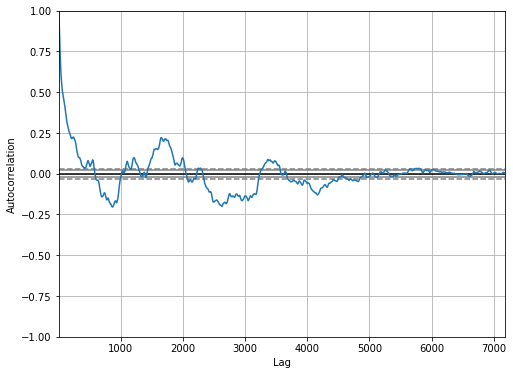

In [ ]:
#Let us plot auto correlation plot
pd.plotting.autocorrelation_plot(dfDelhi_na['2015':'2018']['AQI'])

 - To get a clear visualization, let's consider the correlation between current data to the past 1 hour, 3 hours, 24 hours and 1 year.


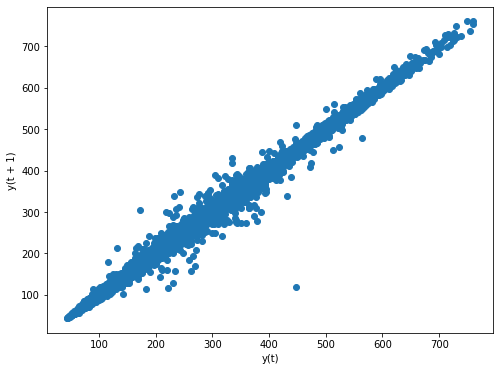

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['AQI'], lag=1)

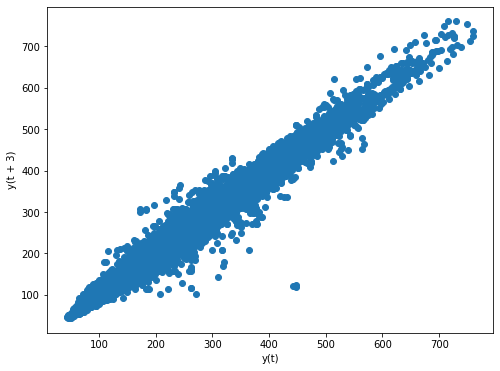

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['AQI'], lag=3)

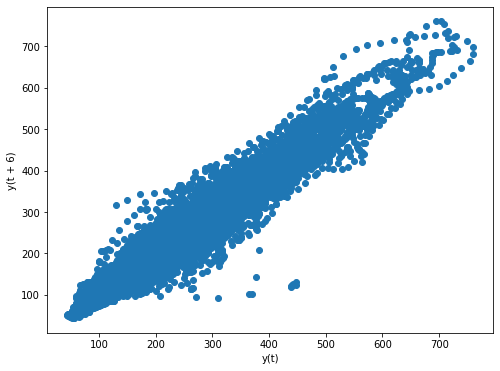

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['AQI'], lag=6)

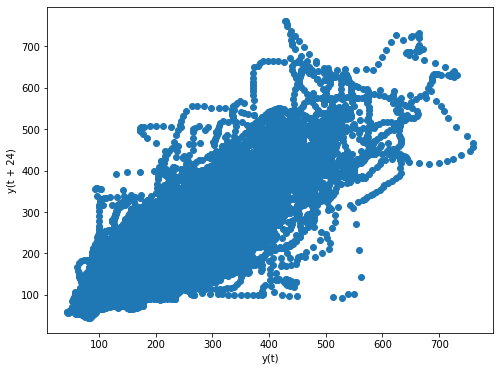

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['AQI'], lag=24)

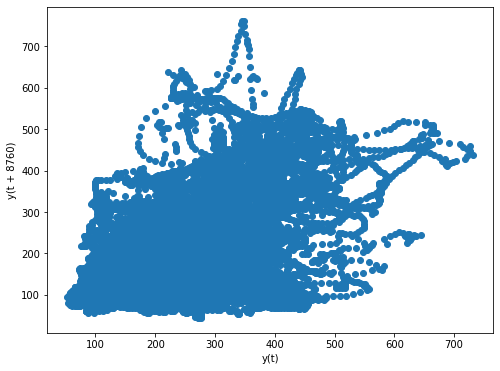

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['AQI'], lag=24*365)

- We can observe that the linearity is slightly reduced for 24 hour difference and it's more severe for one year difference. So we must stick to a a mean of maximum for 24 hours.

- For filling the null values in a time series dataset we can use some techniques as below.
   - Last Observation Carrief Forward (ffill)
   - Next Observation Carried Backward (bfill)
   - Rolling Statistical
   - Interpolation
  
- Here we are going to use ffill, bfill ans rolling statistical methods to copare each one of them in order to have best fit method to fill the null values.

In [ ]:
dfDelhi.query('AQI != AQI')

,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
Datetime,,,,,,,,,,,,,,,
2015-07-04 22:00:00,Delhi,98.96,NaN,6.75,44.20,24.44,89.75,NaN,5.00,20.47,1.35,2.62,NaN,NaN,NaN
2015-07-04 23:00:00,Delhi,89.51,NaN,5.86,48.27,26.53,91.00,NaN,5.31,15.64,1.58,2.98,NaN,NaN,NaN
2015-07-05 00:00:00,Delhi,107.36,NaN,9.46,43.08,25.23,88.25,NaN,4.91,15.01,1.28,2.62,NaN,NaN,NaN
2015-07-05 01:00:00,Delhi,83.16,NaN,7.20,39.47,24.43,86.75,NaN,5.11,16.35,1.14,2.51,NaN,NaN,NaN
2015-07-05 02:00:00,Delhi,94.93,NaN,6.87,38.09,23.43,90.00,NaN,6.16,14.62,1.16,2.50,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-31 11:00:00,Delhi,41.29,61.88,15.13,50.47,29.16,NaN,0.83,NaN,22.92,0.27,0.40,0.22,NaN,NaN
2017-08-31 12:00:00,Delhi,58.55,83.86,14.64,51.38,29.19,NaN,0.79,NaN,25.76,0.26,0.39,0.22,NaN,NaN
2017-08-31 13:00:00,Delhi,63.81,91.30,14.46,51.05,29.12,NaN,0.79,NaN,24.57,0.28,0.37,0.20,NaN,NaN


In [ ]:
#let's choose a sample range to test these methods
#Null values exist on 2015-07-04 t0 2015-07-05
dfDelhi['2015-07-04':'2015-07-06']

,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
Datetime,,,,,,,,,,,,,,,
2015-07-04 00:00:00,Delhi,28.92,114.92,19.34,41.09,63.34,36.52,1.04,10.74,37.73,1.10,2.77,NaN,227.0,Poor
2015-07-04 01:00:00,Delhi,27.12,88.96,9.06,36.86,103.43,37.78,0.96,9.02,40.93,0.96,1.96,NaN,250.0,Poor
2015-07-04 02:00:00,Delhi,26.58,60.25,5.02,28.10,73.13,38.78,0.80,9.22,46.56,0.33,0.79,NaN,247.0,Poor
2015-07-04 03:00:00,Delhi,24.83,53.04,5.48,26.93,72.61,38.50,0.85,8.85,41.03,0.23,0.69,NaN,241.0,Poor
2015-07-04 04:00:00,Delhi,15.62,42.34,4.79,25.62,66.76,38.18,0.86,8.59,42.99,0.27,0.73,NaN,203.0,Poor
2015-07-04 05:00:00,Delhi,23.54,44.46,17.60,30.56,115.87,37.19,1.08,9.28,35.27,0.33,0.71,NaN,190.0,Moderate
2015-07-04 06:00:00,Delhi,37.17,71.11,38.68,35.77,42.94,41.46,1.03,9.12,43.65,0.34,0.94,NaN,179.0,Moderate
2015-07-04 07:00:00,Delhi,47.28,129.72,50.42,37.83,48.82,40.61,1.07,8.21,48.18,0.55,1.01,NaN,176.0,Moderate
2015-07-04 08:00:00,Delhi,72.17,162.61,65.85,41.07,65.74,40.23,1.22,8.31,62.06,0.99,2.10,NaN,180.0,Moderate


In [ ]:
#Let's assign the null value relatables to a imputant dataframe
dfDelhi_imp = dfDelhi['2015-07-04 15:00:00' : '2015-07-05 09:00:00'][['AQI']]
dfDelhi_imp.isnull().sum()

AQI    6
dtype: int64

- We can find 6 missing values in this range

In [ ]:
dfDelhi_imp

,AQI
Datetime,
2015-07-04 15:00:00,280.0
2015-07-04 16:00:00,280.0
2015-07-04 17:00:00,324.0
2015-07-04 18:00:00,324.0
2015-07-04 19:00:00,321.0
2015-07-04 20:00:00,309.0
2015-07-04 21:00:00,222.0
2015-07-04 22:00:00,NaN
2015-07-04 23:00:00,NaN


In [ ]:
#Let's apply forward filling
dfDelhi_imp['FFILL'] = dfDelhi_imp['AQI'].fillna(method='ffill')
dfDelhi_imp

,AQI,FFILL
Datetime,,
2015-07-04 15:00:00,280.0,280.0
2015-07-04 16:00:00,280.0,280.0
2015-07-04 17:00:00,324.0,324.0
2015-07-04 18:00:00,324.0,324.0
2015-07-04 19:00:00,321.0,321.0
2015-07-04 20:00:00,309.0,309.0
2015-07-04 21:00:00,222.0,222.0
2015-07-04 22:00:00,NaN,222.0
2015-07-04 23:00:00,NaN,222.0


In [ ]:
#Let's apply backward filling
dfDelhi_imp['BFILL'] = dfDelhi_imp['AQI'].fillna(method='bfill')
dfDelhi_imp

,AQI,FFILL,BFILL
Datetime,,,
2015-07-04 15:00:00,280.0,280.0,280.0
2015-07-04 16:00:00,280.0,280.0,280.0
2015-07-04 17:00:00,324.0,324.0,324.0
2015-07-04 18:00:00,324.0,324.0,324.0
2015-07-04 19:00:00,321.0,321.0,321.0
2015-07-04 20:00:00,309.0,309.0,309.0
2015-07-04 21:00:00,222.0,222.0,222.0
2015-07-04 22:00:00,NaN,222.0,246.0
2015-07-04 23:00:00,NaN,222.0,246.0


- A rapid change of AQI within a day is cannot be expected but sometimes in our datset there are consecutive null values for several days. So for those values, above two methods may give faulty resuls.

In [ ]:
#Let's apply statistical rolling for 2 hours
dfDelhi_imp['ROLL2'] = dfDelhi_imp['AQI'].rolling(window=2, min_periods=1).mean()
dfDelhi_imp

,AQI,FFILL,BFILL,ROLL2
Datetime,,,,
2015-07-04 15:00:00,280.0,280.0,280.0,280.0
2015-07-04 16:00:00,280.0,280.0,280.0,280.0
2015-07-04 17:00:00,324.0,324.0,324.0,302.0
2015-07-04 18:00:00,324.0,324.0,324.0,324.0
2015-07-04 19:00:00,321.0,321.0,321.0,322.5
2015-07-04 20:00:00,309.0,309.0,309.0,315.0
2015-07-04 21:00:00,222.0,222.0,222.0,265.5
2015-07-04 22:00:00,NaN,222.0,246.0,222.0
2015-07-04 23:00:00,NaN,222.0,246.0,NaN


- It is not working for consecutive days. Here we may need at least window size of 7

In [ ]:
#Let's apply statistical rolling for 7 hours
dfDelhi_imp['ROLL7'] = dfDelhi_imp['AQI'].rolling(window=7, min_periods=1).mean().round()
dfDelhi_imp

,AQI,FFILL,BFILL,ROLL2,ROLL7
Datetime,,,,,
2015-07-04 15:00:00,280.0,280.0,280.0,280.0,280.0
2015-07-04 16:00:00,280.0,280.0,280.0,280.0,280.0
2015-07-04 17:00:00,324.0,324.0,324.0,302.0,295.0
2015-07-04 18:00:00,324.0,324.0,324.0,324.0,302.0
2015-07-04 19:00:00,321.0,321.0,321.0,322.5,306.0
2015-07-04 20:00:00,309.0,309.0,309.0,315.0,306.0
2015-07-04 21:00:00,222.0,222.0,222.0,265.5,294.0
2015-07-04 22:00:00,NaN,222.0,246.0,222.0,297.0
2015-07-04 23:00:00,NaN,222.0,246.0,NaN,300.0


In [ ]:
#Let's apply interpolation with quadratic method
dfDelhi_imp['InterPol'] = dfDelhi_imp['AQI'].interpolate(option='quadratic').round()
dfDelhi_imp

,AQI,FFILL,BFILL,ROLL2,ROLL7,InterPol
Datetime,,,,,,
2015-07-04 15:00:00,280.0,280.0,280.0,280.0,280.0,280.0
2015-07-04 16:00:00,280.0,280.0,280.0,280.0,280.0,280.0
2015-07-04 17:00:00,324.0,324.0,324.0,302.0,295.0,324.0
2015-07-04 18:00:00,324.0,324.0,324.0,324.0,302.0,324.0
2015-07-04 19:00:00,321.0,321.0,321.0,322.5,306.0,321.0
2015-07-04 20:00:00,309.0,309.0,309.0,315.0,306.0,309.0
2015-07-04 21:00:00,222.0,222.0,222.0,265.5,294.0,222.0
2015-07-04 22:00:00,NaN,222.0,246.0,222.0,297.0,225.0
2015-07-04 23:00:00,NaN,222.0,246.0,NaN,300.0,229.0


#### So we can come to a conclusion that by observing the related values of null values, we accordingly choose either FFILL, BFILL or ROLL methods.

In [ ]:
#Let us again sort out null valued rows for AQI value
dfDelhi.query('AQI != AQI')

,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
Datetime,,,,,,,,,,,,,,,
2015-07-04 22:00:00,Delhi,98.96,NaN,6.75,44.20,24.44,89.75,NaN,5.00,20.47,1.35,2.62,NaN,NaN,NaN
2015-07-04 23:00:00,Delhi,89.51,NaN,5.86,48.27,26.53,91.00,NaN,5.31,15.64,1.58,2.98,NaN,NaN,NaN
2015-07-05 00:00:00,Delhi,107.36,NaN,9.46,43.08,25.23,88.25,NaN,4.91,15.01,1.28,2.62,NaN,NaN,NaN
2015-07-05 01:00:00,Delhi,83.16,NaN,7.20,39.47,24.43,86.75,NaN,5.11,16.35,1.14,2.51,NaN,NaN,NaN
2015-07-05 02:00:00,Delhi,94.93,NaN,6.87,38.09,23.43,90.00,NaN,6.16,14.62,1.16,2.50,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-31 11:00:00,Delhi,41.29,61.88,15.13,50.47,29.16,NaN,0.83,NaN,22.92,0.27,0.40,0.22,NaN,NaN
2017-08-31 12:00:00,Delhi,58.55,83.86,14.64,51.38,29.19,NaN,0.79,NaN,25.76,0.26,0.39,0.22,NaN,NaN
2017-08-31 13:00:00,Delhi,63.81,91.30,14.46,51.05,29.12,NaN,0.79,NaN,24.57,0.28,0.37,0.20,NaN,NaN


In [ ]:
import plotly.express as px

fig = px.line(dfDelhiFr, x='Datetime', y='AQI', title='AQI Over the Period')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=2, label="2y", step="year", stepmode="backward"),
            dict(count=3, label="3y", step="year", stepmode="backward"),
            dict(count=4, label="4y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

In [ ]:
dfDelhitmp = dfDelhi.copy()
dfDelhitmp.loc['2015-07-04 20:00:00':'2015-07-05 05:00:00', 'AQI'] = dfDelhitmp.loc['2015-07-04 20:00:00':'2015-07-05 05:00:00', 'AQI'].rolling(window=7, min_periods=1).mean().round()
dfDelhitmp.loc['2015-10-17 01:00:00':'2015-10-18 11:00:00', 'AQI'] = dfDelhitmp.loc['2015-10-17 01:00:00':'2015-10-18 11:00:00', 'AQI'].fillna(method='bfill')
dfDelhitmp.loc['2016-03-13 18:00:00':'2016-03-15 06:00:00', 'AQI'] = dfDelhitmp.loc['2016-03-13 18:00:00':'2016-03-15 06:00:00', 'AQI'].fillna(method='bfill')
dfDelhitmp.loc['2016-07-23 20:00:00':'2016-07-25 00:00:00', 'AQI'] = (dfDelhitmp.loc['2016-07-23 19:00:00', 'AQI'] + dfDelhitmp.loc['2016-07-25 01:00:00', 'AQI'])/2
dfDelhitmp.loc['2016-09-28 01:00:00':'2016-09-29 07:00:00', 'AQI'] = (dfDelhitmp.loc['2016-09-28 00:00:00', 'AQI'] + dfDelhitmp.loc['2016-09-29 08:00:00', 'AQI'])/2
dfDelhitmp.loc['2017-06-10 17:00:00':'2017-06-11 02:00:00', 'AQI'] = (dfDelhitmp.loc['2017-06-10 16:00:00', 'AQI'] + dfDelhitmp.loc['2017-06-11 03:00:00', 'AQI'])/2
dfDelhitmp.loc['2017-06-15 01:00:00':'2017-06-16 07:00:00', 'AQI'] = (dfDelhitmp.loc['2017-06-15 00:00:00', 'AQI'] + dfDelhitmp.loc['2017-06-16 08:00:00', 'AQI'])/2
dfDelhitmp.loc['2017-06-22 23:00:00':'2017-06-24 01:00:00', 'AQI'] = (dfDelhitmp.loc['2017-06-22 22:00:00', 'AQI'] + dfDelhitmp.loc['2017-06-24 02:00:00', 'AQI'])/2
dfDelhitmp.loc['2017-08-12 02:00:00':'2017-08-15 02:00:00', 'AQI'] = dfDelhitmp.loc['2017-08-12 02:00:00':'2017-08-15 02:00:00', 'AQI'].fillna(method='bfill')
dfDelhitmp.loc['2017-08-21 15:00:00':'2017-08-31 16:00:00', 'AQI'] = dfDelhitmp.loc['2017-08-21 14:00:00':'2017-08-31 17:00:00', 'AQI'].fillna(method='bfill')

In [ ]:
import plotly.express as px

fig = px.line(dfDelhitmp, y='AQI', title='AQI Over the Period')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=2, label="2y", step="year", stepmode="backward"),
            dict(count=3, label="3y", step="year", stepmode="backward"),
            dict(count=4, label="4y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

In [ ]:
dfDelhitmp.isnull().sum()

City              0
PM2.5           375
PM10           2418
NO              298
NO2             330
NOx              25
NH3             980
CO              364
SO2            2852
O3             2201
Benzene          38
Toluene          26
Xylene        18904
AQI               0
AQI_Bucket      483
dtype: int64

- We can traverse through the grapgh to find the null value to fill accordingly

Let us fill the null values of other features. Let us start from  PM2.5. First we need to check the autocorrelation plot to undersdand its correlation with past or future values.

First let us explore the correlation of each pollutant with AQI values so that we can remove unrelated features from the dataframe.

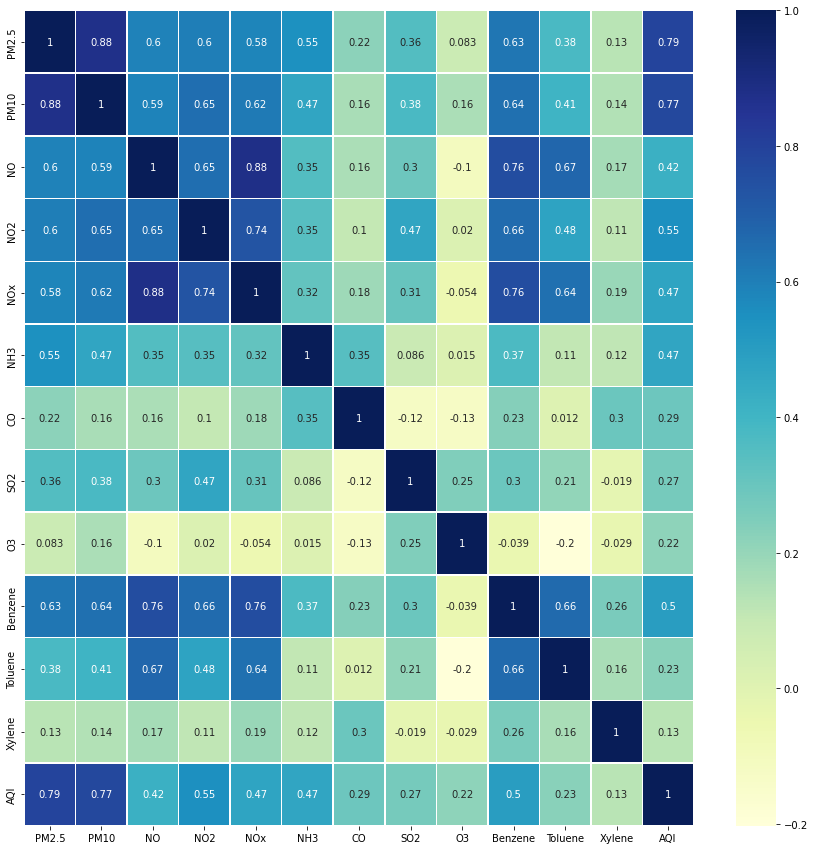

In [ ]:
data = dfDelhi_na .corr()
fig, ax = plt.subplots(figsize=(15,15))   
sb.heatmap(data, cmap="YlGnBu", annot=True, linewidths=.5, ax=ax); 

- Since 'Xylene' does not much affect the AQI value according to the correlation table, and alse 'Xylene' has 18904 null values we will drop that feature from the table and as well as AQI-bucket column.

In [ ]:
dfDelhitmp = dfDelhitmp.drop(['Xylene','AQI_Bucket'], axis=1)

In [ ]:
dfDelhitmp.isnull().sum()

City          0
PM2.5       375
PM10       2418
NO          298
NO2         330
NOx          25
NH3         980
CO          364
SO2        2852
O3         2201
Benzene      38
Toluene      26
AQI           0
dtype: int64

## Let us start from PM2.5 to Toluene by analysing the behaviour.

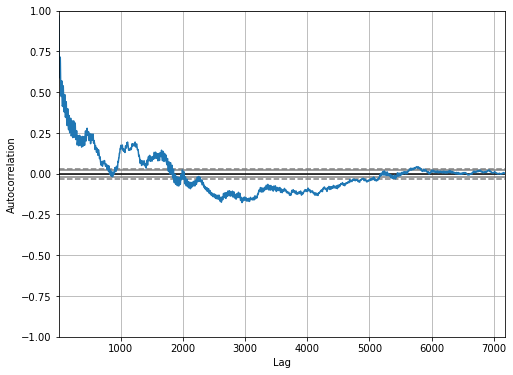

In [ ]:
pd.plotting.autocorrelation_plot(dfDelhi_na['2015':'2018']['PM2.5'])

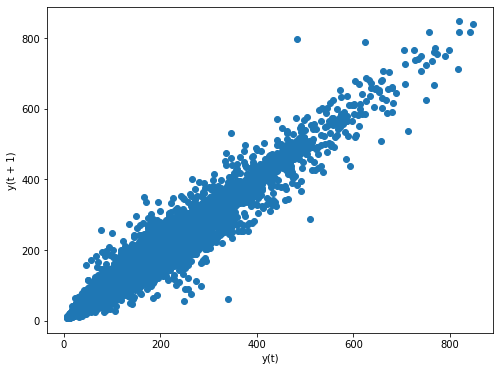

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['PM2.5'], lag=1)

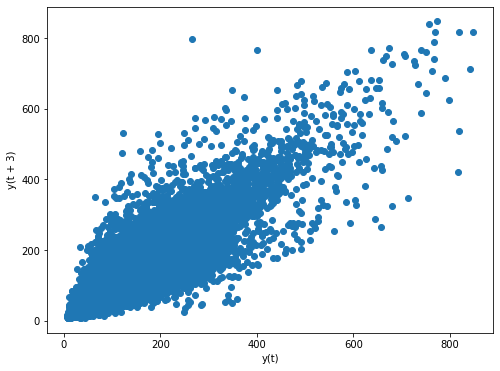

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['PM2.5'], lag=3)

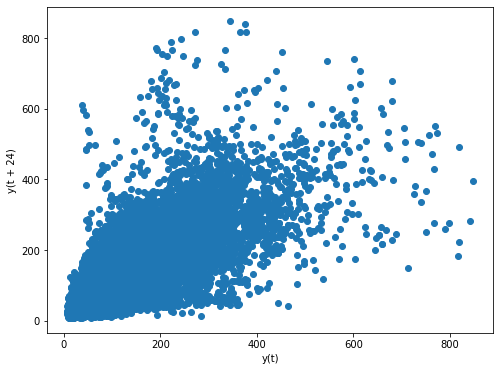

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['PM2.5'], lag=24)

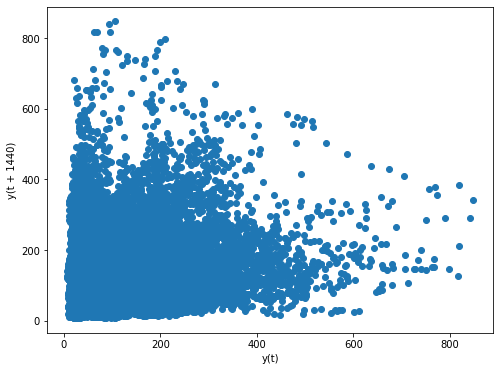

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['PM2.5'], lag=24*60)

In [ ]:
dfDelhitmp

,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI
Datetime,,,,,,,,,,,,,
2015-01-01 16:00:00,Delhi,211.51,340.66,13.09,37.08,47.07,33.54,15.24,12.33,34.35,3.51,5.85,456.0
2015-01-01 17:00:00,Delhi,191.12,257.40,15.44,38.40,51.24,34.98,13.11,18.00,34.38,3.58,5.23,450.0
2015-01-01 18:00:00,Delhi,218.44,351.01,22.85,44.73,59.26,34.80,18.35,19.17,38.42,3.67,5.93,446.0
2015-01-01 19:00:00,Delhi,296.80,600.95,69.20,47.76,101.68,34.25,16.67,21.50,49.12,14.75,27.13,475.0
2015-01-01 20:00:00,Delhi,336.43,714.63,148.42,46.31,171.10,35.75,12.17,17.67,56.44,26.56,45.62,480.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-30 20:00:00,Delhi,43.19,123.26,6.33,22.28,17.66,29.92,0.92,10.64,44.13,1.63,17.83,97.0
2020-06-30 21:00:00,Delhi,45.30,125.22,6.34,22.91,17.96,29.95,1.04,10.59,39.62,1.72,18.06,99.0
2020-06-30 22:00:00,Delhi,49.04,129.39,6.29,20.95,16.80,30.01,1.00,10.20,38.95,1.66,16.17,101.0


- We can simply use ffill or bfill methods since daily values are not much dependant on previous values more than 1 hour.

In [ ]:
dfDelhitmp.loc['2015-01-01 16:00:00':'2020-07-01 00:00:00', 'PM2.5'] = dfDelhitmp.loc['2015-01-01 16:00:00':'2020-07-01 00:00:00', 'PM2.5'].fillna(method='bfill')

In [ ]:
dfDelhitmp.isnull().sum()

City          0
PM2.5         0
PM10       2418
NO          298
NO2         330
NOx          25
NH3         980
CO          364
SO2        2852
O3         2201
Benzene      38
Toluene      26
AQI           0
dtype: int64

### Filling Null Values of PM10

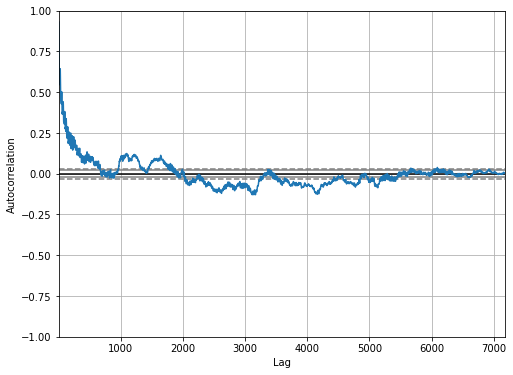

In [ ]:
pd.plotting.autocorrelation_plot(dfDelhi_na['2015':'2018']['PM10'])

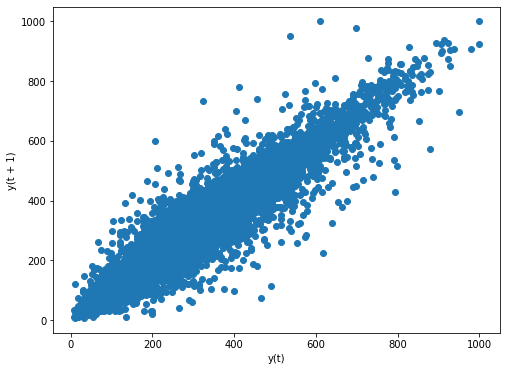

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['PM10'], lag=1)

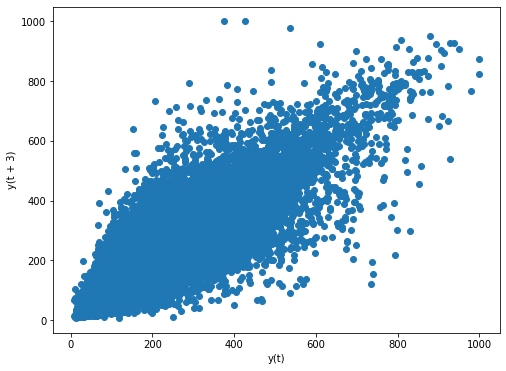

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['PM10'], lag=3)

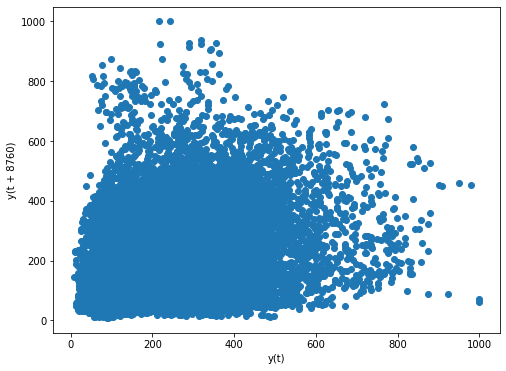

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['PM10'], lag=24*365)

- We cannot see any significant relationship among timely data of PM10. We can take the rolling mean to fill the null values.

In [ ]:
import plotly.express as px

fig = px.line(dfDelhitmp, y='PM10', title='PM10 Over the Period')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=2, label="2y", step="year", stepmode="backward"),
            dict(count=3, label="3y", step="year", stepmode="backward"),
            dict(count=4, label="4y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

In [ ]:
dfDelhitmp.query('PM10 != PM10')

,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI
Datetime,,,,,,,,,,,,,
2015-01-15 03:00:00,Delhi,148.50,NaN,53.61,70.82,85.22,113.59,17.84,3.78,40.31,5.21,17.32,346.0
2015-01-15 04:00:00,Delhi,148.50,NaN,32.53,48.75,59.13,126.37,16.46,5.25,42.07,3.83,13.84,334.0
2015-01-21 14:00:00,Delhi,167.50,NaN,9.21,17.51,30.68,37.75,8.84,6.17,16.83,4.13,9.96,330.0
2015-01-21 15:00:00,Delhi,168.00,NaN,9.78,17.52,32.78,40.02,9.79,6.17,18.41,4.03,8.55,330.0
2015-01-21 16:00:00,Delhi,164.50,NaN,10.72,18.05,35.65,41.85,9.42,8.33,18.57,4.39,10.07,329.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-09-18 09:00:00,Delhi,73.00,NaN,45.10,100.85,12.32,44.10,0.00,NaN,NaN,0.28,0.00,91.0
2017-09-18 10:00:00,Delhi,89.00,NaN,39.10,110.10,12.36,45.20,0.00,NaN,NaN,0.33,0.00,93.0
2017-10-07 14:00:00,Delhi,74.58,NaN,9.18,24.19,9.32,20.27,0.04,18.94,79.38,0.14,1.20,193.0


In [ ]:
dfDelhitmp['PM10'] = dfDelhitmp['PM10'].interpolate(option='quadratic')

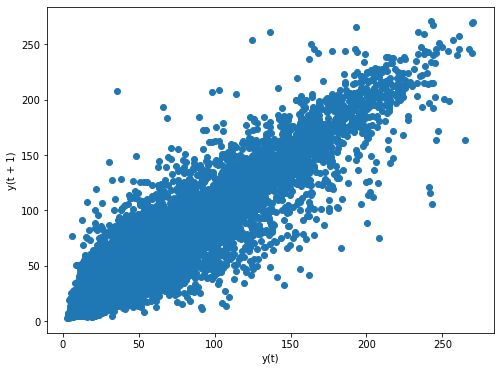

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['NO'], lag=1)

In [ ]:
dfDelhitmp['NO'] = dfDelhitmp['NO'].interpolate(option='quadratic')

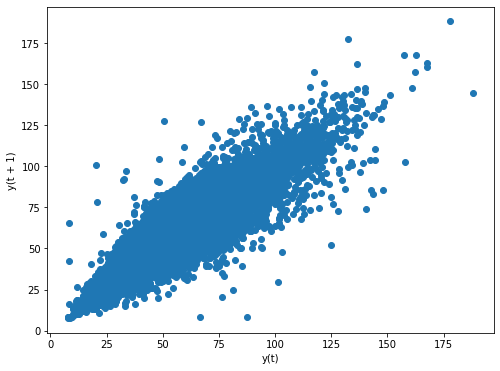

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['NO2'], lag=1)

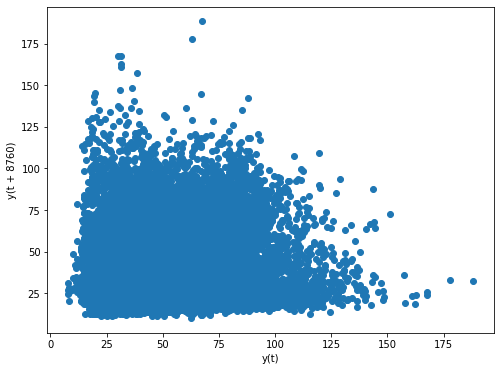

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['NO2'], lag=24*365)

In [ ]:
dfDelhitmp['NO2'] = dfDelhitmp['NO2'].interpolate(option='quadratic')

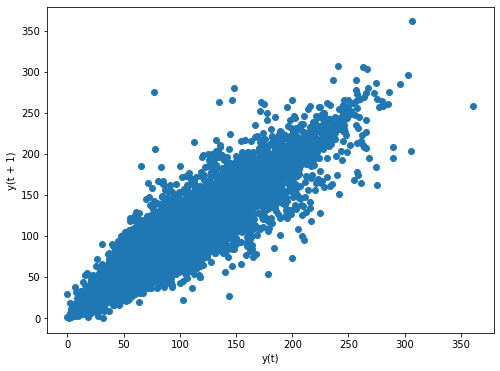

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['NOx'], lag=1)

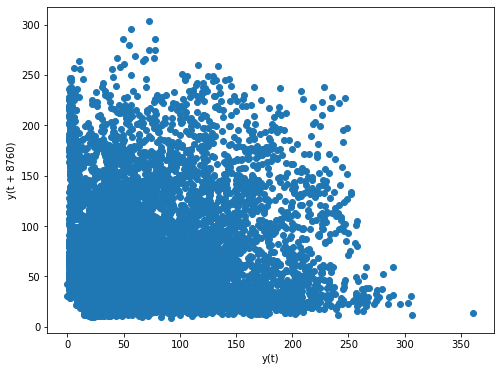

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['NOx'], lag=24*365)

In [ ]:
dfDelhitmp['NOx'] = dfDelhitmp['NOx'].interpolate(option='linear')

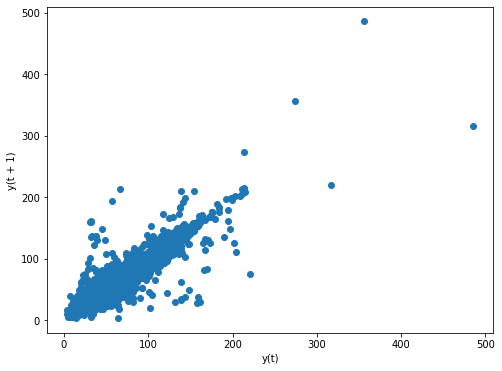

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['NH3'], lag=1)

In [ ]:
dfDelhitmp['NH3'] = dfDelhitmp['NH3'].interpolate(option='linear')

In [ ]:
dfDelhitmp.isnull().sum()

City          0
PM2.5         0
PM10          0
NO            0
NO2           0
NOx           0
NH3           0
CO          364
SO2        2852
O3         2201
Benzene      38
Toluene      26
AQI           0
dtype: int64

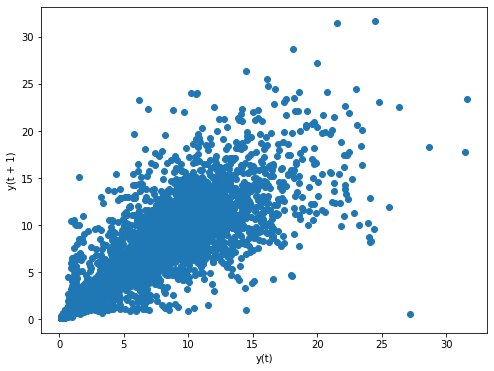

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['CO'], lag=1)

In [ ]:
dfDelhitmp['CO'] = dfDelhitmp['CO'].interpolate(option='quadratic')

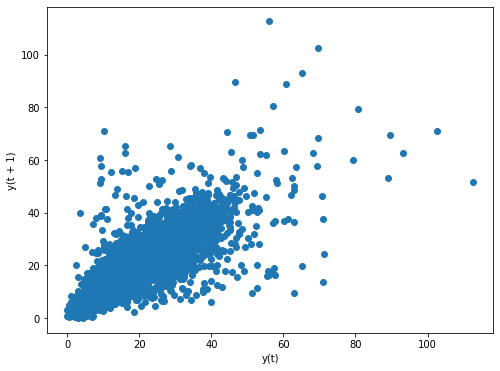

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['SO2'], lag=1)

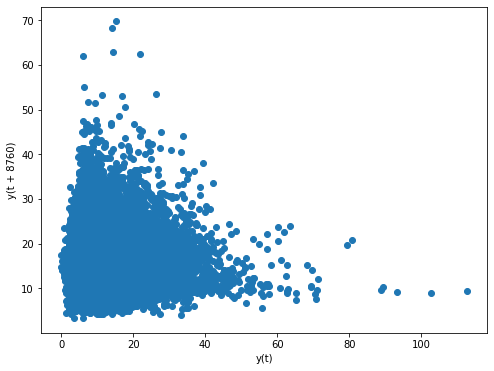

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['SO2'], lag=24*365)

In [ ]:
dfDelhitmp['SO2'] = dfDelhitmp['SO2'].interpolate(option='quadratic')

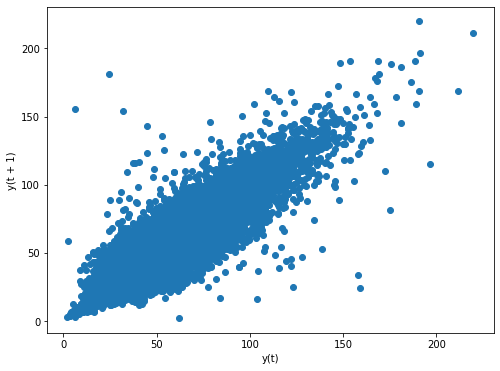

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['O3'], lag=1)

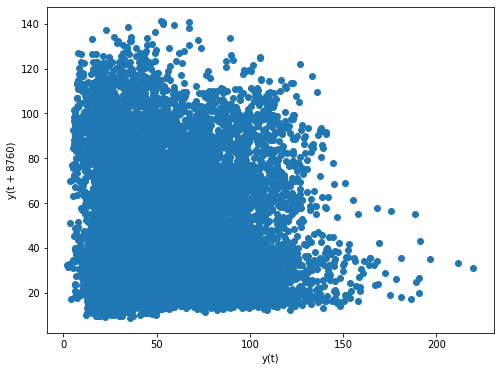

In [ ]:
pd.plotting.lag_plot(dfDelhi_na['O3'], lag=24*365)

In [ ]:
dfDelhitmp['O3'] = dfDelhitmp['O3'].interpolate(option='quadratic')

In [ ]:
dfDelhitmp.isnull().sum()

City        0
PM2.5       0
PM10        0
NO          0
NO2         0
NOx         0
NH3         0
CO          0
SO2         0
O3          0
Benzene    38
Toluene    26
AQI         0
dtype: int64

In [ ]:
dfDelhitmp['Benzene'] = dfDelhitmp['Benzene'].interpolate(option='quadratic')

In [ ]:
dfDelhitmp['Toluene'] = dfDelhitmp['Toluene'].interpolate(option='quadratic')

In [ ]:
dfDelhitmp.isnull().sum()

City       0
PM2.5      0
PM10       0
NO         0
NO2        0
NOx        0
NH3        0
CO         0
SO2        0
O3         0
Benzene    0
Toluene    0
AQI        0
dtype: int64

### Now we have successfully filled all the null values of our data frame. Now we are ready to do modelling!

## Time Series Modelling and Forecasting 

## 1. Modeling with ARIMA & SARIMA

In [ ]:
!pip install pmdarima

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#importing libraries for time series forecasting
import warnings
import itertools
warnings.filterwarnings("ignore")

import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.ar_model import AR
from statsmodels.tsa.arima_model import ARMA, ARIMA
from pmdarima.arima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX


from math import sqrt

from random import random

#importing evaluation metrics 

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error, mean_squared_log_error

- We will use a data frame of AQI values since ARIMA, SARIMA are univariant time sereis forecasting methods.

In [ ]:
dfDelhiAQI = dfDelhitmp[['AQI']]
dfDelhiAQI.head()

,AQI
Datetime,
2015-01-01 16:00:00,456.0
2015-01-01 17:00:00,450.0
2015-01-01 18:00:00,446.0
2015-01-01 19:00:00,475.0
2015-01-01 20:00:00,480.0


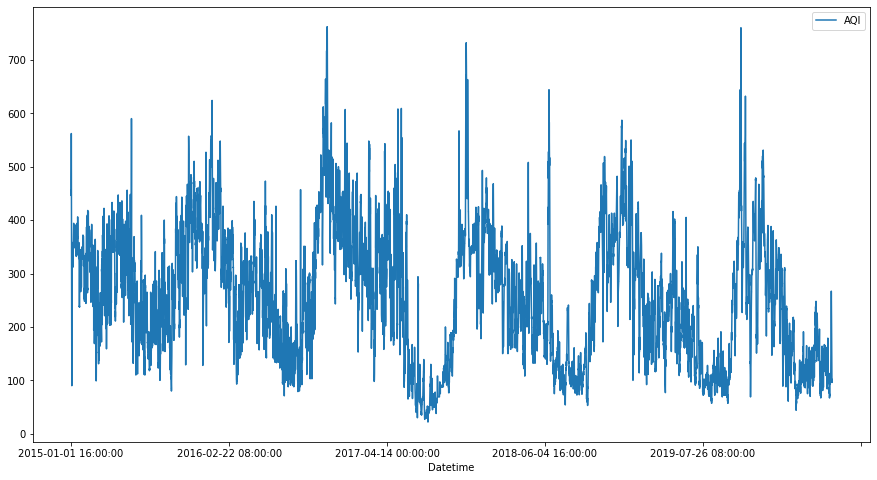

In [ ]:
dfDelhiAQI.plot(figsize=(15, 8))
plt.show()

- The distribution is not agaussian distribution. We can apply transformations to the data.

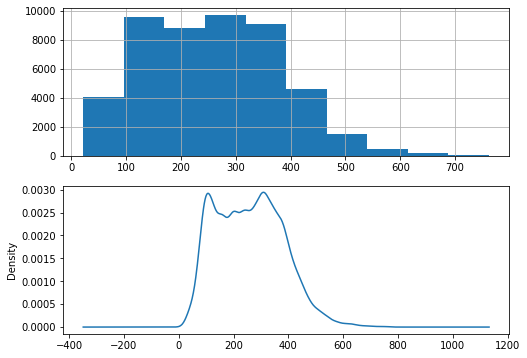

In [ ]:
plt.figure(1)
plt.subplot(211)
dfDelhiAQI.AQI.hist()
plt.subplot(212)
dfDelhiAQI.AQI.plot(kind='kde')
plt.show()

### Decomposition of the time series

- We can use statistical models to decompose the series.
- We will be able to see the trend, seasonal and residual components of our data.

In [ ]:
dff = dfDelhiAQI[['AQI']]
dff

,AQI
Datetime,
2015-01-01 16:00:00,456.0
2015-01-01 17:00:00,450.0
2015-01-01 18:00:00,446.0
2015-01-01 19:00:00,475.0
2015-01-01 20:00:00,480.0
...,...
2020-06-30 20:00:00,97.0
2020-06-30 21:00:00,99.0
2020-06-30 22:00:00,101.0


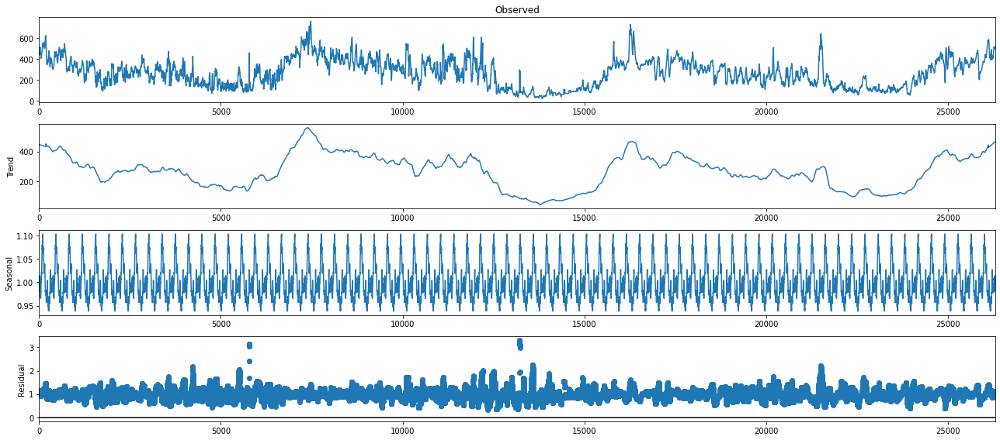

In [ ]:
dff.sort_index(inplace=True)
from pylab import rcParams
from datetime import date as dt
rcParams['figure.figsize'] = 18, 8
dfftemp = dff['2016-01-01 00:00:00' : '2019-01-00 00:00:00'][['AQI']]
decomposition = seasonal_decompose(dfftemp.values, model='multiplicative', extrapolate_trend='freq', period=365)
fig = decomposition.plot()
plt.show()

### Checking the seasonality of the series

1.	ACF and PACF plots – If the time series is stationary, the ACF/PACF plots will show a rapid decrease in correlation after a small amount of lag between points.
2.	Provide moving statistics – We can plot the moving average or moving variance and see if it varies over time. The moving average/variance is for any moment "t", is the average/variance of the last year, that is, the last 12 months.
3.	Augmented Dickey-Fuller test: This is one of the statistical tests to check stationarity. Here the null hypothesis is that the TS is not stationary. The test results comprise a test statistic and some critical values for different confidence levels. If the "test statistic" is less than the "critical value", we can reject the null hypothesis and say that the series is stationary.


1. ACF and PACF Plots

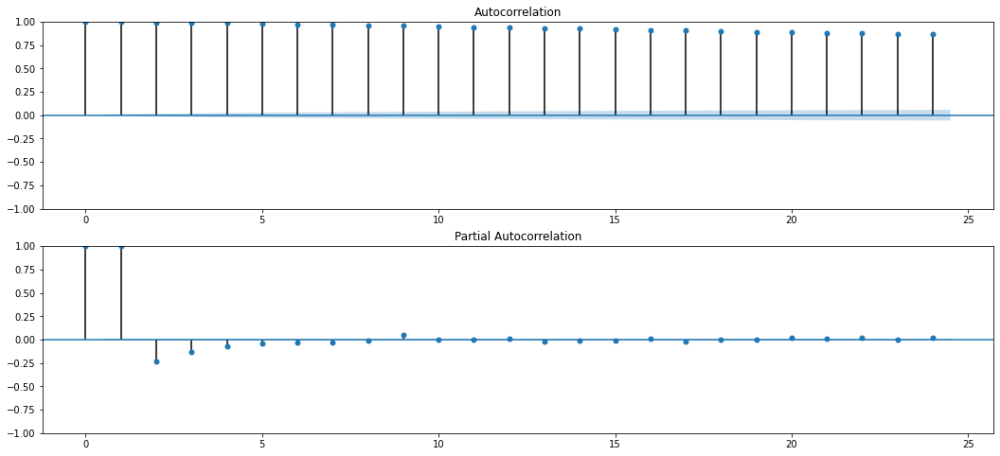

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

plt.figure()
plt.subplot(211)
plot_acf(dff.AQI, ax=plt.gca(), lags = 24)
plt.subplot(212)
plot_pacf(dff.AQI, ax=plt.gca(), lags = 24)
plt.show()

- Let's review the graphs of the autocorrelation function (ACF) and the partial autocorrelation function (PACF)
If the time series is stationary, the ACF/PACF plots will show a rapid drop in correlation after a small amount of lag between points.
- These data are not stationary since a large number of previous observations correlate with future values.
- Confidence intervals are drawn as a cone.                                                                                                                                                                                                                   


2. Continuous Statistics

In [ ]:
# #Determing rolling statistics
# rolmean = dff.rolling(24*30).mean()
# rolstd = dff.rolling(24*30).std()

# #Plot rolling statistics:
# orig = plt.plot(dfftemp, color='blue',label='Original')
# mean = plt.plot(rolmean, color='red', label='Rolling Mean')
# std = plt.plot(rolstd, color='black', label = 'Rolling Std')
# plt.legend(loc='best')
# plt.title('Rolling Mean & Standard Deviation')
# plt.show(block=False)


3. Dickey Fuller Test

- Null hypothesis: The time series is not stationary
- Reject nul hypothesis - if low p-value

In [ ]:
# #Perform Dickey-Fuller test:
# print ('Results of Dickey-Fuller Test:')
# dftest = adfuller(dff.AQI, autolag='AIC')
# dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
# for key,value in dftest[4].items():
#     dfoutput['Critical Value (%s)'%key] = value
# print (dfoutput)

According to the Dickey-Fuller test we can reject null hypothesis and go with the fact that the time series is stationary.



### Log Transformation on the dataset

In [ ]:
ts_log = np.log(dff)
#plt.plot(ts_log)

## Removing Trend and Seasonality

1. Moving Average

- Here we can take the average of the last month, that is, the last 24*30 values.

In [ ]:
moving_avg = ts_log.rolling(24*30).mean()

# plt.plot(ts_log)
# plt.plot(moving_avg, color='red')

In [ ]:
ts_log_moving_avg_diff = ts_log.AQI - moving_avg.AQI

2. Exponentially Weighted Moving Average

In [ ]:
expwighted_avg = ts_log.ewm(halflife=24*30).mean()
# plt.plot(ts_log)
# plt.plot(expwighted_avg, color='red')

In [ ]:
ts_log_ewma_diff = ts_log.AQI - expwighted_avg.AQI

# #Perform Dickey-Fuller test:
# print ('Results of Dickey-Fuller Test:')
# dftest = adfuller(ts_log_ewma_diff, autolag='AIC')
# dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
# for key,value in dftest[4].items():
#     dfoutput['Critical Value (%s)'%key] = value
# print (dfoutput)

3. Differentiation

In [ ]:
ts_log_diff = ts_log.AQI - ts_log.AQI.shift()
#plt.plot(ts_log_diff)

In [ ]:
ts_log_diff.dropna(inplace=True)

In [ ]:
# #Determing rolling statistics
# rolmean = ts_log_diff.rolling(24*30).mean()
# rolstd = ts_log_diff.rolling(24*30).std()

# #Plot rolling statistics:
# orig = plt.plot(ts_log_diff, color='blue',label='Original')
# mean = plt.plot(rolmean, color='red', label='Rolling Mean')
# std = plt.plot(rolstd, color='black', label = 'Rolling Std')
# plt.legend(loc='best')
# plt.title('Rolling Mean & Standard Deviation')
# plt.show(block=False)


In [ ]:
# #Perform Dickey-Fuller test:
# print ('Results of Dickey-Fuller Test:')
# dftest = adfuller(ts_log_diff, autolag='AIC')
# dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
# for key,value in dftest[4].items():
#     dfoutput['Critical Value (%s)'%key] = value
# print (dfoutput)

4. Decomposition

In [ ]:
# from statsmodels.tsa.seasonal import seasonal_decompose
# decomposition = seasonal_decompose(ts_log, model='multiplicative', extrapolate_trend='freq', period=365)

# trend = decomposition.trend
# seasonal = decomposition.seasonal
# residual = decomposition.resid

# plt.subplot(411)
# plt.plot(ts_log, label='Original')
# plt.legend(loc='best')
# plt.subplot(412)
# plt.plot(trend, label='Trend')
# plt.legend(loc='best')
# plt.subplot(413)
# plt.plot(seasonal,label='Seasonality')
# plt.legend(loc='best')
# plt.subplot(414)
# plt.plot(residual, label='Residuals')
# plt.legend(loc='best')
# plt.tight_layout()

# Methods of Air Quality Forecasting

## Autoregression (AR)

In [ ]:
from statsmodels.tsa.ar_model import AutoReg as AR
from random import random

We pass the data which are already made stationary.

In [ ]:
# fit model
model = AR(ts_log_diff, lags=24)
model_fit = model.fit()

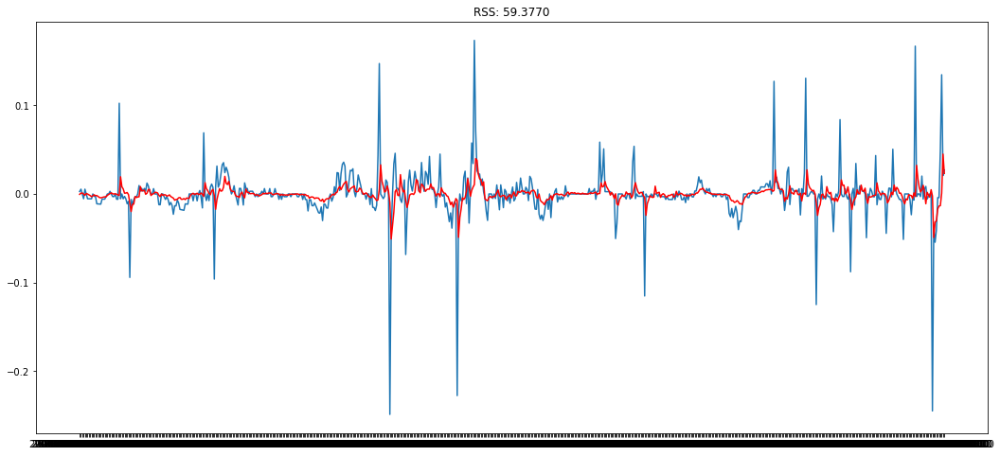

In [ ]:
plt.plot(ts_log_diff['2015-02-01 17:00:00' : '2015-03-01 00:00:00'])
#dfftemp = dff['2016-01-01 00:00:00' : '2019-01-00 00:00:00'][['AQI']]
plt.plot(model_fit.fittedvalues['2015-02-01 17:00:00' : '2015-03-01 00:00:00'], color='red')
plt.title('RSS: %.4f'% np.nansum((model_fit.fittedvalues-ts_log_diff)**2))
plt.show()

In general, the model is fitting quite well
to our data set.
We can see some points where it does not fit.

#### Reverse transformations

One thing we did is transforming the data.
Therefore, if we want to represent the AQI prediction carried by the model, we cannot
display the result directly.
Therefore we would have to invert the
transformations.

In [ ]:
predictions_ARIMA_diff = pd.Series(model_fit.fittedvalues, copy=True)
print(predictions_ARIMA_diff.head())

Datetime
2015-01-02 17:00:00    0.008582
2015-01-02 18:00:00    0.002212
2015-01-02 19:00:00   -0.000990
2015-01-02 20:00:00    0.001429
2015-01-02 21:00:00   -0.006425
dtype: float64


From 2015-01-01 to 2015-01-31, data has been lost because of the transformation.

For the entire data set we have to perform
a cumulative sum to reverse the differentiation.
Remember that to transform the data we did a subtraction
of the moving average.

##### Cumulative sum to reverse differentiation

In [ ]:
predictions_ARIMA_diff_cumsum = predictions_ARIMA_diff.cumsum()
print(predictions_ARIMA_diff_cumsum.head())

Datetime
2015-01-02 17:00:00    0.008582
2015-01-02 18:00:00    0.010794
2015-01-02 19:00:00    0.009804
2015-01-02 20:00:00    0.011232
2015-01-02 21:00:00    0.004807
dtype: float64


#### Add the value of the first month that was previously removed when differentiating

In [ ]:
predictions_ARIMA_log = pd.Series(ts_log.AQI.iloc[0], index=ts_log.index)
predictions_ARIMA_log = predictions_ARIMA_log.add(predictions_ARIMA_diff_cumsum,fill_value=0)
predictions_ARIMA_log.head()

Datetime
2015-01-01 16:00:00    6.122493
2015-01-01 17:00:00    6.122493
2015-01-01 18:00:00    6.122493
2015-01-01 19:00:00    6.122493
2015-01-01 20:00:00    6.122493
dtype: float64

Finally, remember that we bind the logarithmic function
to transform the data. To Invert this function we have to do add or take the exponent.

#### Taking exponent to invert logarithmic transformation

In [ ]:
predictions_ARIMA = np.exp(predictions_ARIMA_log)

Text(0.5, 1.0, 'RMSE: 95.8352')

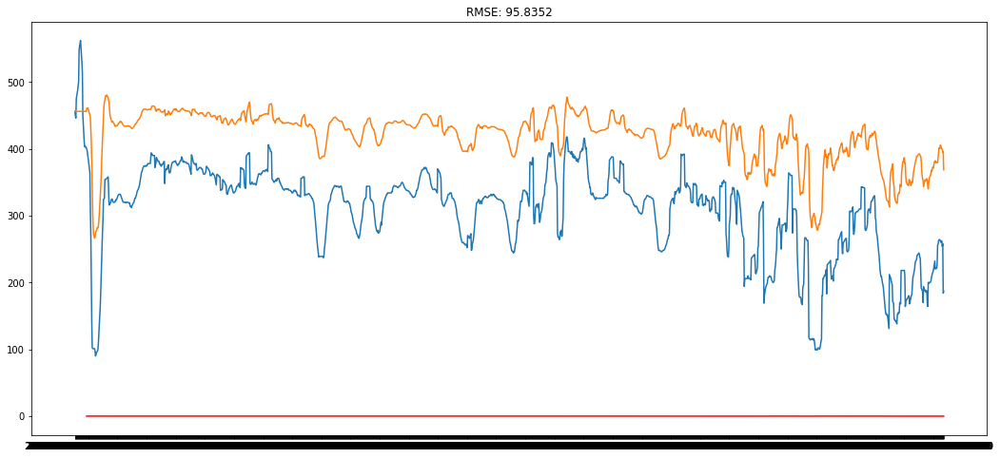

In [ ]:
plt.plot(dff['2015-01-01 16:00:00' : '2015-03-20 00:00:00'].AQI)
plt.plot(predictions_ARIMA['2015-01-01 16:00:00' : '2015-03-20 00:00:00'])
plt.plot(model_fit.fittedvalues['2015-01-01 16:00:00' : '2015-03-20 00:00:00'], color='red')
plt.title('RMSE: %.4f'% np.sqrt(np.nansum((predictions_ARIMA-dff.AQI)**2)/len(dff.AQI)))

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error, mean_squared_log_error

In [ ]:
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

### Let us evaluate the model according to the evaluation metrics chosen.

In [ ]:
def evaluate_forecast(y, pred):
    results = pd.DataFrame({'r2_score':r2_score(y, pred),
                           }, index=[0])
    results['mean_absolute_error'] = mean_absolute_error(y, pred)
    results['median_absolute_error'] = median_absolute_error(y, pred)
    results['mse'] = mean_squared_error(y, pred)
    results['msle'] = mean_squared_log_error(y, pred)
    results['mape'] = mean_absolute_percentage_error(y, pred)
    results['rmse'] = np.sqrt(results['mse'])
    return results

In [ ]:
evaluate_forecast(dff.AQI, predictions_ARIMA)

,r2_score,mean_absolute_error,median_absolute_error,mse,msle,mape,rmse
0,0.382734,76.515461,66.904993,9184.376556,0.162777,37.222587,95.835153


## Auto Regressive Integrated Moving Average (ARIMA)

In [ ]:
ts = dff.AQI - dff.AQI.shift()
ts.dropna(inplace=True)

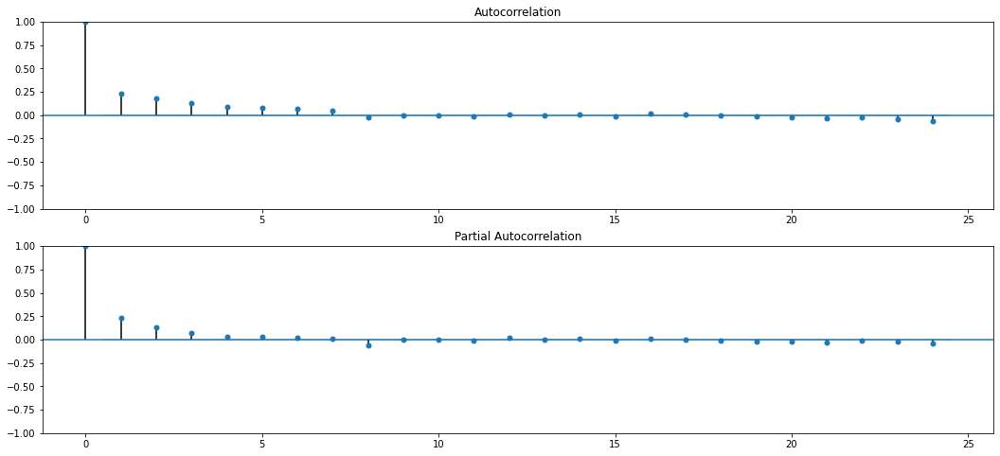

In [ ]:
plt.figure()
plt.subplot(211)
plot_acf(ts, ax=plt.gca(),lags=24)
plt.subplot(212)
plot_pacf(ts, ax=plt.gca(),lags=24)
plt.show()

### Interpretation of ACF graphs

ACF Shape	| Indicated Model |
-- | -- |
Exponential, decaying to zero |	Autoregressive model. Use the partial autocorrelation plot to identify the order of the autoregressive model |
Alternating positive and negative, decaying to zero	Autoregressive model. |  Use the partial autocorrelation plot to help identify the order. |
One or more spikes, rest are essentially zero | Moving average model, order identified by where plot becomes zero. |
Decay, starting after a few lags |	Mixed autoregressive and moving average (ARMA) model. | 
All zero or close to zero | Data are essentially random. |
High values at fixed intervals | Include seasonal autoregressive term. |
No decay to zero |	Series is not stationary |

In [ ]:
dfarr = dff.copy()
dfarr.reset_index(level=0, inplace=True)
dfarr

,Datetime,AQI
0,2015-01-01 16:00:00,456.0
1,2015-01-01 17:00:00,450.0
2,2015-01-01 18:00:00,446.0
3,2015-01-01 19:00:00,475.0
4,2015-01-01 20:00:00,480.0
...,...,...
48172,2020-06-30 20:00:00,97.0
48173,2020-06-30 21:00:00,99.0
48174,2020-06-30 22:00:00,101.0
48175,2020-06-30 23:00:00,102.0


- We will move with monthly average since the hourly dataset is highly stationary.

In [ ]:
dfar = dfarr.groupby(pd.PeriodIndex(dfarr['Datetime'], freq="M"))['AQI'].mean()

In [ ]:
dfar

Datetime
2015-01    339.429945
2015-02    327.974702
2015-03    256.143817
2015-04    305.218056
2015-05    348.584677
              ...    
2020-03    135.836022
2020-04    113.019444
2020-05    148.634409
2020-06    125.772222
2020-07    101.000000
Freq: M, Name: AQI, Length: 67, dtype: float64

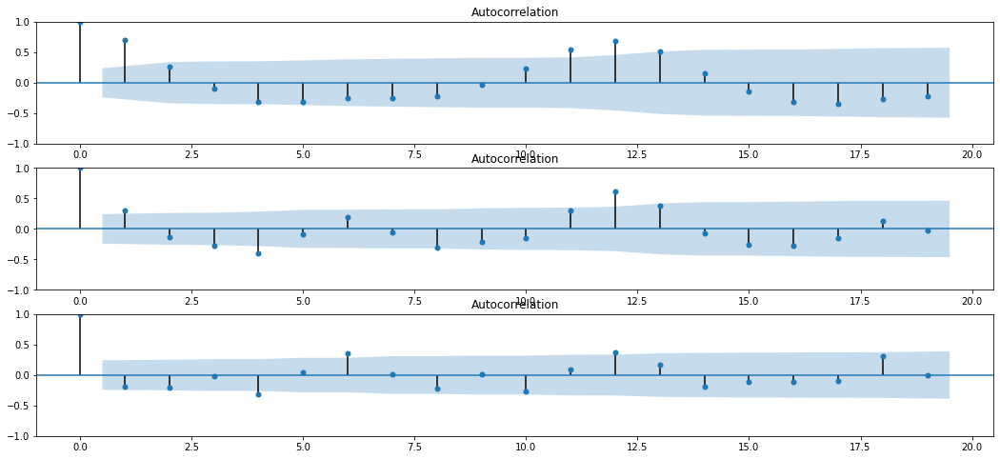

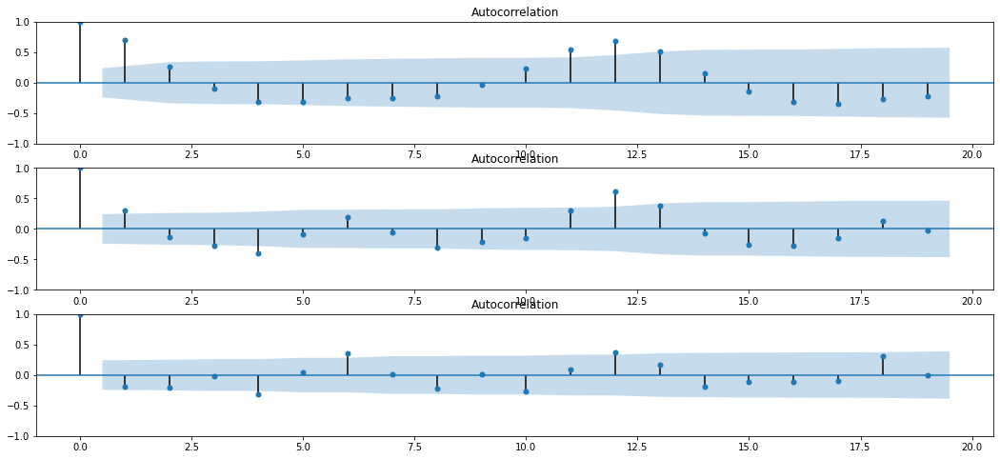

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
fig, (ax1, ax2, ax3) = plt.subplots(3)
plot_acf(dfar, ax=ax1)
plot_acf(dfar.diff().dropna(), ax=ax2)
plot_acf(dfar.diff().diff().dropna(), ax=ax3)

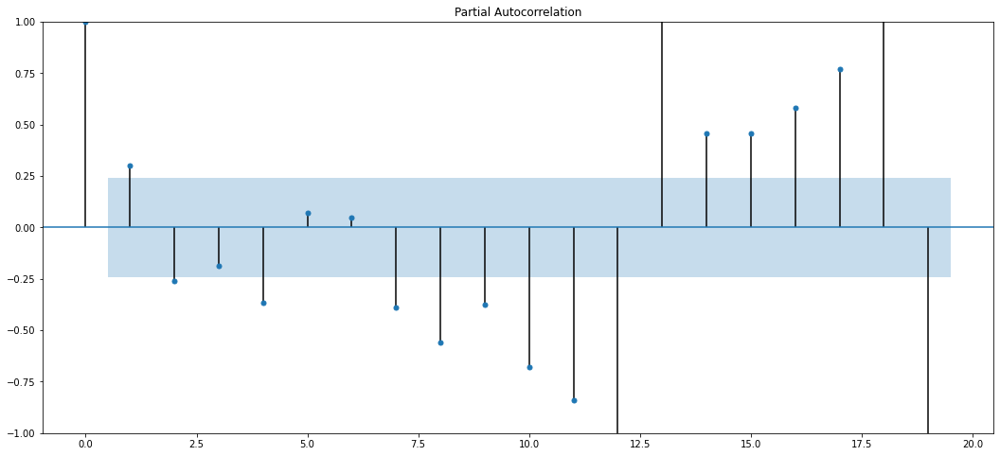

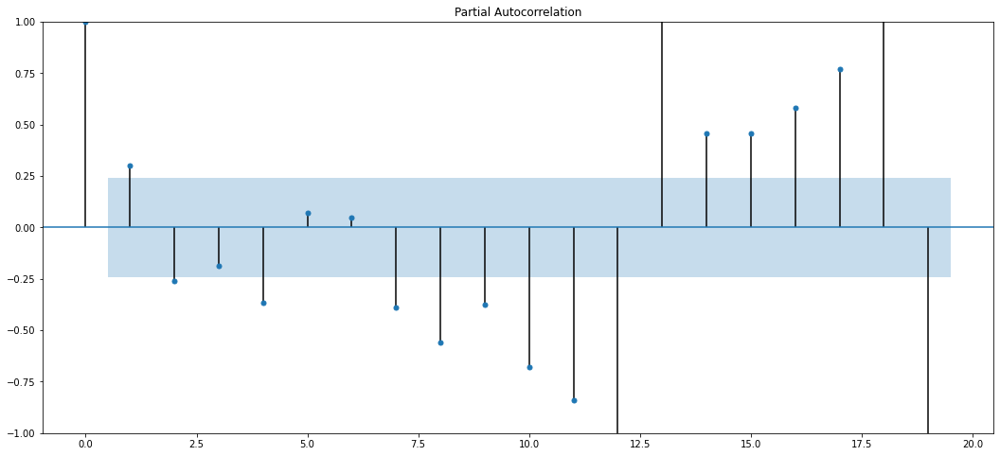

In [ ]:
plot_pacf(dfar.diff().dropna())

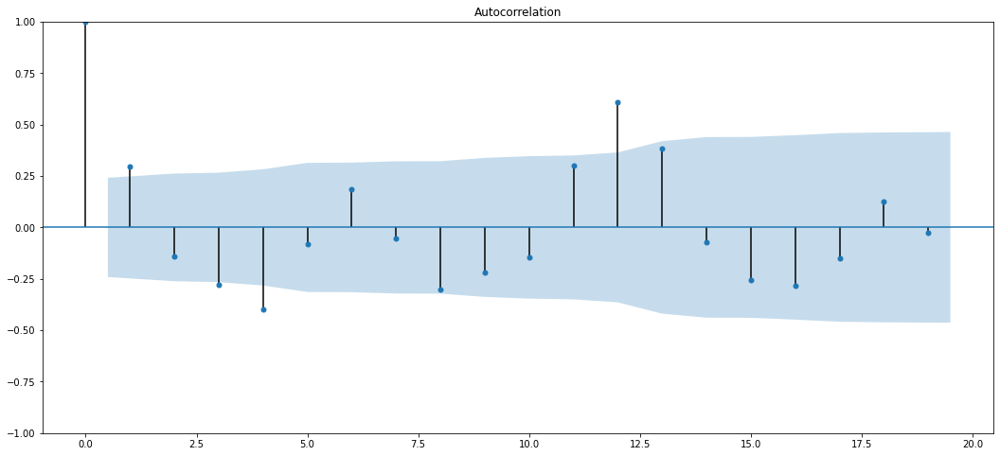

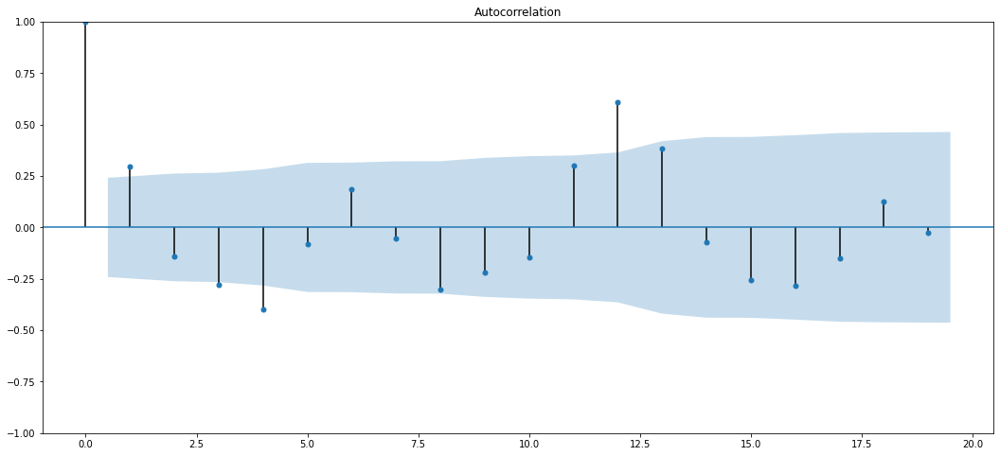

In [ ]:
plot_acf(dfar.diff().dropna())

In [ ]:
#divide into train and validation set

train = dfar[:int(0.75*(len(dfar)))]
valid = dfar[int(0.75*(len(dfar))):]

In [ ]:
# ARIMA example
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
import itertools

In [ ]:
# model_ts = ARIMA(train, order = pqd[index])
model_ts = ARIMA(train, order = (7,1,2))
model_ts_fit = model_ts.fit()
print(model_ts_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                    AQI   No. Observations:                   50
Model:                 ARIMA(7, 1, 2)   Log Likelihood                -259.669
Date:                Thu, 25 Aug 2022   AIC                            539.338
Time:                        21:11:51   BIC                            558.256
Sample:                    01-31-2015   HQIC                           546.515
                         - 02-28-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.1746      0.154      7.631      0.000       0.873       1.476
ar.L2         -0.7234      0.237     -3.057      0.002      -1.187      -0.260
ar.L3          0.0240      0.283      0.085      0.9

In [ ]:
start_index = valid.index.min()
end_index = valid.index.max()

arima_predict = model_ts_fit.predict(start = start_index, end = end_index)

In [ ]:
# report performance
mse = mean_squared_error(valid, arima_predict)
rmse = sqrt(mse)
print('RMSE: {}, MSE:{}'.format(rmse, mse))

RMSE: 47.848379486701546, MSE:2289.4674195034013


In [ ]:
arima_predict

2019-03    237.789192
2019-04    241.807910
2019-05    213.934073
2019-06    177.347450
2019-07    116.733625
2019-08     90.695701
2019-09    157.251236
2019-10    264.202720
2019-11    355.390127
2019-12    390.444943
2020-01    353.169422
2020-02    292.014088
2020-03    248.990837
2020-04    221.310036
2020-05    195.196731
2020-06    157.435868
2020-07    119.713788
Freq: M, Name: predicted_mean, dtype: float64

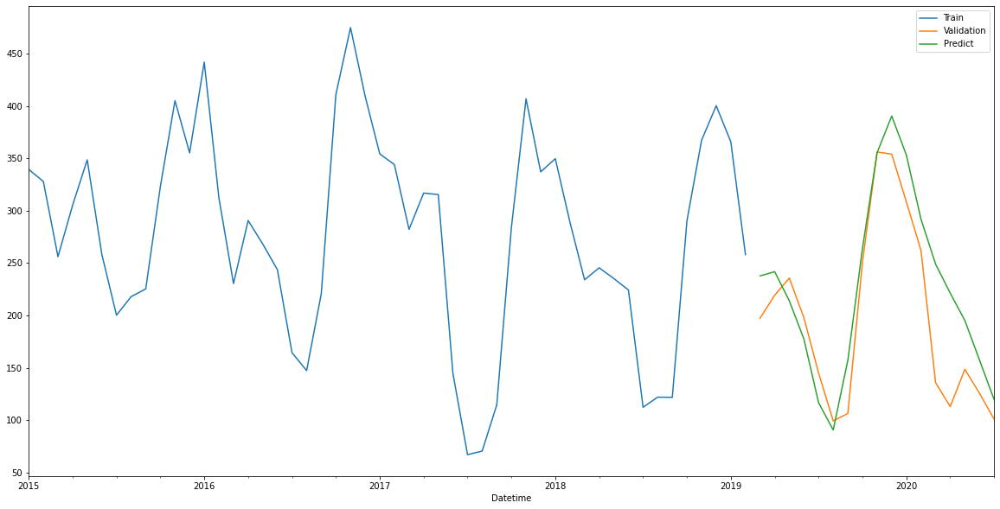

In [ ]:
plt.figure(figsize = (20,10))
train.plot(label = "Train")
valid.plot(label = "Validation")
arima_predict.plot(label = 'Predict')
plt.legend()
plt.show()

In [ ]:
evaluate_forecast(valid, arima_predict)

,r2_score,mean_absolute_error,median_absolute_error,mse,msle,mape,rmse
0,0.674028,37.412375,29.82587,2289.46742,0.0748,24.820433,47.848379


## Seasonal Autoregressive Integrated Moving Average (SARIMA)[link text](https://)

In [ ]:
import statsmodels.api as sm

In [ ]:
sarima_model = sm.tsa.statespace.SARIMAX(train, trend='n', order=(7,1,1), seasonal_order=(1,1,1,12))
model_fit = sarima_model.fit()
print(model_fit.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                AQI   No. Observations:                   50
Model:             SARIMAX(7, 1, 1)x(1, 1, 1, 12)   Log Likelihood                -191.589
Date:                            Thu, 25 Aug 2022   AIC                            405.179
Time:                                    17:43:18   BIC                            422.899
Sample:                                01-31-2015   HQIC                           411.426
                                     - 02-28-2019                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6525      0.273      2.386      0.017       0.117       1.188
ar.L2         -0.1505      0.340   

In [ ]:
start_index = valid.index.min()
end_index = valid.index.max()

#Predictions
predictions = model_fit.predict(start=start_index, end=end_index)

In [ ]:
# report performance
mse = mean_squared_error(dfar[start_index:end_index], predictions)
rmse = sqrt(mse)
print('RMSE: {}, MSE:{}'.format(rmse,mse))

RMSE: 49.42335980510951, MSE:2442.6684944253143


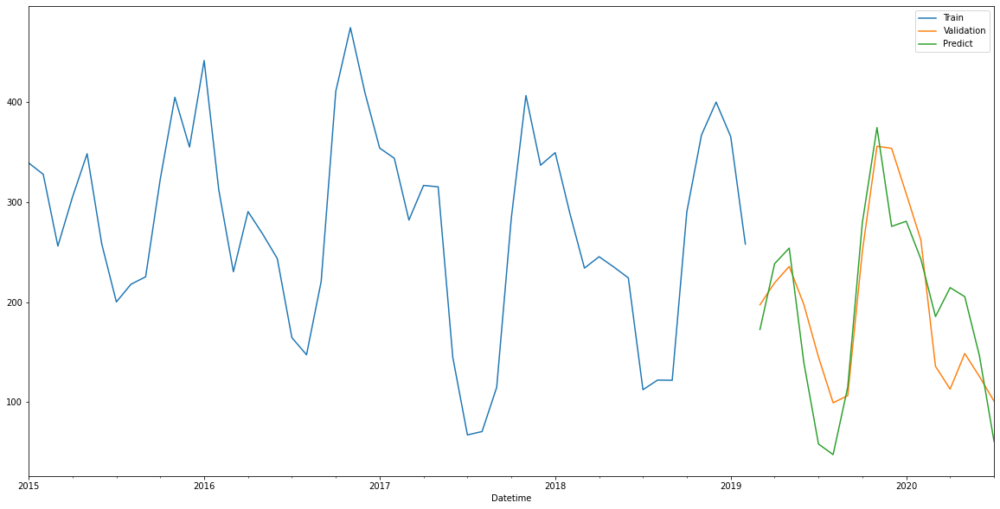

In [ ]:
plt.figure(figsize = (20,10))
train.plot(label = "Train")
valid.plot(label = "Validation")
predictions.plot(label = 'Predict')
plt.legend()
plt.show()

In [ ]:
evaluate_forecast(valid, predictions)

,r2_score,mean_absolute_error,median_absolute_error,mse,msle,mape,rmse
0,0.652215,41.730916,28.73892,2442.668494,0.145709,26.761564,49.42336


## Prophet

- From now on, we can move with multivariate time sereis models. So we will use Delhi dataset which we had some pre processing earlier.

In [ ]:
dfDelhitmp.head()

,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI
Datetime,,,,,,,,,,,,,
2015-01-01 16:00:00,Delhi,211.51,340.66,13.09,37.08,47.07,33.54,15.24,12.33,34.35,3.51,5.85,456.0
2015-01-01 17:00:00,Delhi,191.12,257.40,15.44,38.40,51.24,34.98,13.11,18.00,34.38,3.58,5.23,450.0
2015-01-01 18:00:00,Delhi,218.44,351.01,22.85,44.73,59.26,34.80,18.35,19.17,38.42,3.67,5.93,446.0
2015-01-01 19:00:00,Delhi,296.80,600.95,69.20,47.76,101.68,34.25,16.67,21.50,49.12,14.75,27.13,475.0
2015-01-01 20:00:00,Delhi,336.43,714.63,148.42,46.31,171.10,35.75,12.17,17.67,56.44,26.56,45.62,480.0


In [ ]:
dfprophet = dfDelhitmp.copy()

In [ ]:
dfprophet.index.dtype

dtype('O')

In [ ]:
dfprophet.index = pd.to_datetime(dfprophet.index)

In [ ]:
# Taking the mean of AQI for each day

dfprophet = dfprophet.resample('D').mean()
dfprophet.head()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI
Datetime,,,,,,,,,,,,
2015-01-01,280.475000,558.180000,90.836250,43.478750,137.603750,39.573750,13.803750,15.563750,44.200000,18.723750,26.690000,471.625000
2015-01-02,186.178333,269.548750,62.091667,32.868333,88.135000,31.834167,9.536667,6.645833,29.968333,10.548750,20.094583,453.625000
2015-01-03,87.176667,131.901250,25.731250,30.313750,47.954167,60.569583,10.610833,2.649167,19.705833,3.910000,10.232083,142.708333
2015-01-04,151.840000,241.840417,25.010000,36.910833,48.617917,130.357083,11.542917,4.633333,25.365000,4.257083,9.708333,319.250000
2015-01-05,146.598333,219.131667,14.011250,34.922500,38.248750,122.881667,9.197083,3.330000,23.204167,2.797500,6.213750,325.416667


In [ ]:
# Reseting index with a row count

dfprophet.reset_index(level=0, inplace=True)
dfprophet

,Datetime,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI
0,2015-01-01,280.475000,558.180000,90.836250,43.478750,137.603750,39.573750,13.803750,15.563750,44.200000,18.723750,26.690000,471.625000
1,2015-01-02,186.178333,269.548750,62.091667,32.868333,88.135000,31.834167,9.536667,6.645833,29.968333,10.548750,20.094583,453.625000
2,2015-01-03,87.176667,131.901250,25.731250,30.313750,47.954167,60.569583,10.610833,2.649167,19.705833,3.910000,10.232083,142.708333
3,2015-01-04,151.840000,241.840417,25.010000,36.910833,48.617917,130.357083,11.542917,4.633333,25.365000,4.257083,9.708333,319.250000
4,2015-01-05,146.598333,219.131667,14.011250,34.922500,38.248750,122.881667,9.197083,3.330000,23.204167,2.797500,6.213750,325.416667
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2004,2020-06-27,39.804583,155.944167,10.875833,21.460833,22.465000,31.432917,0.869583,10.381667,18.880000,1.685833,19.990833,112.000000
2005,2020-06-28,59.522500,308.646250,12.673333,21.604583,23.865000,29.269583,0.940417,10.696667,18.049583,1.709583,25.130000,195.916667
2006,2020-06-29,44.861667,184.120833,10.500833,21.572917,21.940833,27.973333,0.881667,11.578750,26.614167,2.127083,23.802083,232.875000
2007,2020-06-30,39.800000,91.976250,5.986250,17.955833,15.436250,28.479167,0.844583,10.508750,37.290833,1.572917,16.370833,114.250000


In [ ]:
# Imstalling prophet
!pip install pystan~=2.14
!pip install fbprophet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from fbprophet import Prophet

In [ ]:
dfprophet.rename(columns = {'Datetime':'ds', 'AQI':'y'}, inplace = True)

In [ ]:
# Splitting data as training and testing data

train = dfprophet[(dfprophet['ds'] >= '2015-01-01') & (dfprophet['ds'] <= '2020-01-01')]
test = dfprophet[(dfprophet['ds'] > '2020-01-01')]

In [ ]:
m = Prophet(yearly_seasonality=True)

- To forecast on multiple features, we may use add_regressor method

In [ ]:
m.add_regressor('PM2.5', standardize=False)
m.add_regressor('PM10', standardize=False)
m.add_regressor('NO', standardize=False)
m.add_regressor('NO2', standardize=False)
m.add_regressor('NOx', standardize=False)
m.add_regressor('NH3', standardize=False)
m.add_regressor('CO', standardize=False)
m.add_regressor('SO2', standardize=False)
m.add_regressor('O3', standardize=False)
m.add_regressor('Benzene', standardize=False)
m.add_regressor('Toluene', standardize=False)

In [ ]:
m.fit(train)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [ ]:
m.params

{'k': array([[-0.08120914]]),
 'm': array([[0.2023143]]),
 'delta': array([[-2.12023851e-02, -4.04612391e-02, -1.11553805e-02,
         -6.58321469e-03,  3.11546565e-02,  9.16384795e-02,
          5.88491389e-02,  1.30038774e-02,  1.33976329e-04,
         -6.66883646e-02, -1.05607601e-01, -8.34429952e-02,
         -5.05131450e-02, -2.59920850e-04,  2.89779018e-02,
          1.25100883e-01,  8.17134592e-02,  1.10693021e-02,
          6.39779481e-06,  1.69046694e-04, -8.41136628e-04,
          1.87456737e-03, -4.60533864e-04, -1.56002427e-04,
         -1.01851686e-03]]),
 'sigma_obs': array([[0.05370848]]),
 'beta': array([[ 1.75445636e-02,  3.43715718e-02, -2.72654813e-02,
         -6.02027573e-03,  8.18806215e-03,  1.47598277e-03,
          9.12374959e-03, -4.45325553e-03,  3.86710368e-03,
          4.47428384e-03, -3.67418630e-03, -1.47433615e-03,
         -4.37570016e-03, -2.97889840e-03,  5.09093106e-03,
          3.96517218e-04,  5.65636652e-03,  5.29569291e-03,
         -1.8244619

In [ ]:
train

,ds,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,y
0,2015-01-01,280.475000,558.180000,90.836250,43.478750,137.603750,39.573750,13.803750,15.563750,44.200000,18.723750,26.690000,471.625000
1,2015-01-02,186.178333,269.548750,62.091667,32.868333,88.135000,31.834167,9.536667,6.645833,29.968333,10.548750,20.094583,453.625000
2,2015-01-03,87.176667,131.901250,25.731250,30.313750,47.954167,60.569583,10.610833,2.649167,19.705833,3.910000,10.232083,142.708333
3,2015-01-04,151.840000,241.840417,25.010000,36.910833,48.617917,130.357083,11.542917,4.633333,25.365000,4.257083,9.708333,319.250000
4,2015-01-05,146.598333,219.131667,14.011250,34.922500,38.248750,122.881667,9.197083,3.330000,23.204167,2.797500,6.213750,325.416667
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1822,2019-12-28,275.600417,426.121250,60.129583,55.977917,83.467917,50.470417,1.960000,10.255833,27.919583,6.695833,39.222083,425.041667
1823,2019-12-29,326.791250,500.150000,32.732083,57.761667,61.508750,49.605417,1.856250,10.249583,35.107083,6.279583,33.000833,455.000000
1824,2019-12-30,333.425417,486.353750,54.974583,55.606667,79.035417,50.745417,2.238333,11.152083,26.443750,7.998750,47.118750,506.416667
1825,2019-12-31,245.532917,338.183750,44.489583,47.499583,64.570000,48.216250,1.796667,11.030417,28.071250,4.810833,38.404167,417.083333


In [ ]:
test

,ds,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,y
1827,2020-01-02,327.039583,439.307083,120.756667,64.804167,143.714583,58.264167,3.317917,19.952500,36.503333,9.360833,73.115000,485.333333
1828,2020-01-03,228.904583,337.035417,111.085833,55.654583,131.134167,53.019167,2.798750,14.931250,27.824167,6.960833,66.799167,425.708333
1829,2020-01-04,220.597500,327.217917,86.584583,57.669167,110.201667,53.464167,2.204167,12.849167,29.942500,6.811667,48.179583,366.250000
1830,2020-01-05,170.212500,257.935000,29.991667,48.253750,54.298750,47.939167,1.231667,9.586667,30.206667,3.695833,28.895000,353.625000
1831,2020-01-06,159.637500,247.473333,35.485000,51.188750,60.143333,47.006667,1.270833,11.341667,21.991250,3.524167,31.103750,334.833333
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2004,2020-06-27,39.804583,155.944167,10.875833,21.460833,22.465000,31.432917,0.869583,10.381667,18.880000,1.685833,19.990833,112.000000
2005,2020-06-28,59.522500,308.646250,12.673333,21.604583,23.865000,29.269583,0.940417,10.696667,18.049583,1.709583,25.130000,195.916667
2006,2020-06-29,44.861667,184.120833,10.500833,21.572917,21.940833,27.973333,0.881667,11.578750,26.614167,2.127083,23.802083,232.875000
2007,2020-06-30,39.800000,91.976250,5.986250,17.955833,15.436250,28.479167,0.844583,10.508750,37.290833,1.572917,16.370833,114.250000


In [ ]:
future = m.make_future_dataframe(periods=182)
future.tail()

,ds
2004,2020-06-27
2005,2020-06-28
2006,2020-06-29
2007,2020-06-30
2008,2020-07-01


In [ ]:
future['PM2.5'] = dfprophet['PM2.5']
future['PM10'] = dfprophet['PM10']
future['NO'] = dfprophet['NO']
future['NO2'] = dfprophet['NO2']
future['NOx'] = dfprophet['NOx']
future['NH3'] = dfprophet['NH3']
future['CO'] = dfprophet['CO']
future['SO2'] = dfprophet['SO2']
future['O3'] = dfprophet['O3']
future['Benzene'] = dfprophet['Benzene']
future['Toluene'] = dfprophet['Toluene']

In [ ]:
future.tail()

,ds,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene
2004,2020-06-27,39.804583,155.944167,10.875833,21.460833,22.465000,31.432917,0.869583,10.381667,18.880000,1.685833,19.990833
2005,2020-06-28,59.522500,308.646250,12.673333,21.604583,23.865000,29.269583,0.940417,10.696667,18.049583,1.709583,25.130000
2006,2020-06-29,44.861667,184.120833,10.500833,21.572917,21.940833,27.973333,0.881667,11.578750,26.614167,2.127083,23.802083
2007,2020-06-30,39.800000,91.976250,5.986250,17.955833,15.436250,28.479167,0.844583,10.508750,37.290833,1.572917,16.370833
2008,2020-07-01,54.010000,128.660000,6.330000,21.050000,16.810000,29.060000,0.970000,11.150000,29.730000,2.030000,23.570000


In [ ]:
# Forecasting
forecast = m.predict(future)

In [ ]:
forecast.columns

Index(['ds', 'trend', 'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper',
       'Benzene', 'Benzene_lower', 'Benzene_upper', 'CO', 'CO_lower',
       'CO_upper', 'NH3', 'NH3_lower', 'NH3_upper', 'NO', 'NO_lower',
       'NO_upper', 'NO2', 'NO2_lower', 'NO2_upper', 'NOx', 'NOx_lower',
       'NOx_upper', 'O3', 'O3_lower', 'O3_upper', 'PM10', 'PM10_lower',
       'PM10_upper', 'PM2.5', 'PM2.5_lower', 'PM2.5_upper', 'SO2', 'SO2_lower',
       'SO2_upper', 'Toluene', 'Toluene_lower', 'Toluene_upper',
       'additive_terms', 'additive_terms_lower', 'additive_terms_upper',
       'extra_regressors_additive', 'extra_regressors_additive_lower',
       'extra_regressors_additive_upper', 'weekly', 'weekly_lower',
       'weekly_upper', 'yearly', 'yearly_lower', 'yearly_upper',
       'multiplicative_terms', 'multiplicative_terms_lower',
       'multiplicative_terms_upper', 'yhat'],
      dtype='object')

In [ ]:
# Considering AQI values

forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2004,2020-06-27,135.075392,84.915769,188.313999
2005,2020-06-28,200.970024,153.216230,251.703015
2006,2020-06-29,138.854134,84.391086,184.833109
2007,2020-06-30,98.836036,49.521397,145.546577
2008,2020-07-01,123.072661,71.440319,173.693385


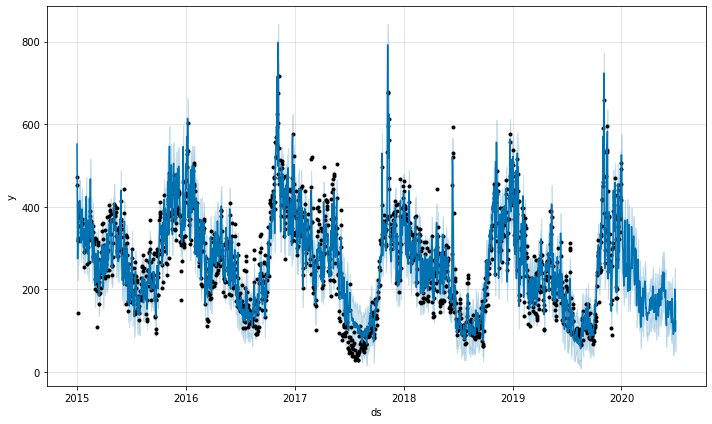

In [ ]:
fig = m.plot(forecast)

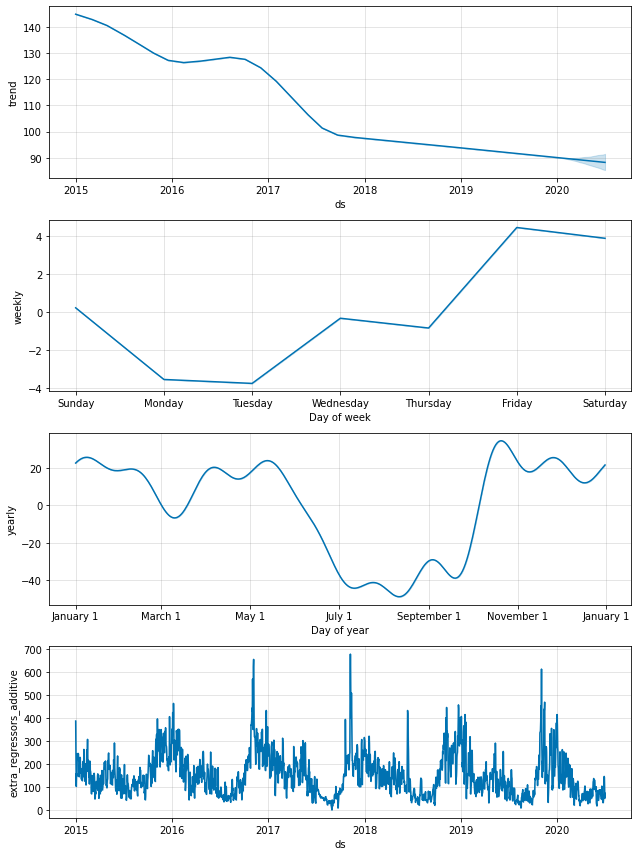

In [ ]:
fig2 = m.plot_components(forecast)

In [ ]:
# Evaluation

from fbprophet.diagnostics import cross_validation, performance_metrics
cv_results = cross_validation(model = m, initial = '731 days', horizon = '365 days')
df_ev = performance_metrics(cv_results)
df_ev

INFO:fbprophet:Making 5 forecasts with cutoffs between 2017-01-01 00:00:00 and 2019-01-01 00:00:00


  0%|          | 0/5 [00:00<?, ?it/s]

,horizon,mse,rmse,mae,mape,mdape,coverage
0,36 days 12:00:00,1880.645139,43.366406,35.415572,0.344638,0.111796,0.730769
1,37 days 00:00:00,1845.734643,42.962014,35.224042,0.335461,0.111796,0.732601
2,37 days 12:00:00,1832.040896,42.802347,34.988011,0.336111,0.111796,0.736264
3,38 days 00:00:00,1878.341992,43.339843,35.466140,0.339048,0.112671,0.727106
4,38 days 12:00:00,1861.002088,43.139333,35.231189,0.339957,0.112671,0.730769
...,...,...,...,...,...,...,...
653,363 days 00:00:00,4328.024902,65.787726,50.603582,0.207479,0.153245,0.595238
654,363 days 12:00:00,4330.577708,65.807125,50.650866,0.210658,0.153245,0.593407
655,364 days 00:00:00,4291.372762,65.508570,50.269651,0.206639,0.149095,0.595238
656,364 days 12:00:00,4286.136949,65.468595,50.227422,0.209043,0.149095,0.593407


## 1-D CNN

In [ ]:
# We will consider AQI value predictions

import tensorflow as tf

dfcnn = dfDelhitmp.copy()
dfcnn

,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI
Datetime,,,,,,,,,,,,,
2015-01-01 16:00:00,Delhi,211.51,340.66,13.09,37.08,47.07,33.54,15.24,12.33,34.35,3.51,5.85,456.0
2015-01-01 17:00:00,Delhi,191.12,257.40,15.44,38.40,51.24,34.98,13.11,18.00,34.38,3.58,5.23,450.0
2015-01-01 18:00:00,Delhi,218.44,351.01,22.85,44.73,59.26,34.80,18.35,19.17,38.42,3.67,5.93,446.0
2015-01-01 19:00:00,Delhi,296.80,600.95,69.20,47.76,101.68,34.25,16.67,21.50,49.12,14.75,27.13,475.0
2015-01-01 20:00:00,Delhi,336.43,714.63,148.42,46.31,171.10,35.75,12.17,17.67,56.44,26.56,45.62,480.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-30 20:00:00,Delhi,43.19,123.26,6.33,22.28,17.66,29.92,0.92,10.64,44.13,1.63,17.83,97.0
2020-06-30 21:00:00,Delhi,45.30,125.22,6.34,22.91,17.96,29.95,1.04,10.59,39.62,1.72,18.06,99.0
2020-06-30 22:00:00,Delhi,49.04,129.39,6.29,20.95,16.80,30.01,1.00,10.20,38.95,1.66,16.17,101.0


In [ ]:
# Let us drop the city column

dfcnn = dfcnn.drop(['City'], axis=1)
dfcnn

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI
Datetime,,,,,,,,,,,,
2015-01-01 16:00:00,211.51,340.66,13.09,37.08,47.07,33.54,15.24,12.33,34.35,3.51,5.85,456.0
2015-01-01 17:00:00,191.12,257.40,15.44,38.40,51.24,34.98,13.11,18.00,34.38,3.58,5.23,450.0
2015-01-01 18:00:00,218.44,351.01,22.85,44.73,59.26,34.80,18.35,19.17,38.42,3.67,5.93,446.0
2015-01-01 19:00:00,296.80,600.95,69.20,47.76,101.68,34.25,16.67,21.50,49.12,14.75,27.13,475.0
2015-01-01 20:00:00,336.43,714.63,148.42,46.31,171.10,35.75,12.17,17.67,56.44,26.56,45.62,480.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-30 20:00:00,43.19,123.26,6.33,22.28,17.66,29.92,0.92,10.64,44.13,1.63,17.83,97.0
2020-06-30 21:00:00,45.30,125.22,6.34,22.91,17.96,29.95,1.04,10.59,39.62,1.72,18.06,99.0
2020-06-30 22:00:00,49.04,129.39,6.29,20.95,16.80,30.01,1.00,10.20,38.95,1.66,16.17,101.0


In [ ]:
# Converting index into DateTime

dfcnn.index = pd.to_datetime(dfcnn.index)
dfcnn

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI
Datetime,,,,,,,,,,,,
2015-01-01 16:00:00,211.51,340.66,13.09,37.08,47.07,33.54,15.24,12.33,34.35,3.51,5.85,456.0
2015-01-01 17:00:00,191.12,257.40,15.44,38.40,51.24,34.98,13.11,18.00,34.38,3.58,5.23,450.0
2015-01-01 18:00:00,218.44,351.01,22.85,44.73,59.26,34.80,18.35,19.17,38.42,3.67,5.93,446.0
2015-01-01 19:00:00,296.80,600.95,69.20,47.76,101.68,34.25,16.67,21.50,49.12,14.75,27.13,475.0
2015-01-01 20:00:00,336.43,714.63,148.42,46.31,171.10,35.75,12.17,17.67,56.44,26.56,45.62,480.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-30 20:00:00,43.19,123.26,6.33,22.28,17.66,29.92,0.92,10.64,44.13,1.63,17.83,97.0
2020-06-30 21:00:00,45.30,125.22,6.34,22.91,17.96,29.95,1.04,10.59,39.62,1.72,18.06,99.0
2020-06-30 22:00:00,49.04,129.39,6.29,20.95,16.80,30.01,1.00,10.20,38.95,1.66,16.17,101.0


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.optimizers import Adam

In [ ]:
# We will add a seconds column to have relative relationship with DateTime for our model

temp_df = dfcnn.copy()
temp_df['Seconds'] = temp_df.index.map(pd.Timestamp.timestamp)
temp_df

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Seconds
Datetime,,,,,,,,,,,,,
2015-01-01 16:00:00,211.51,340.66,13.09,37.08,47.07,33.54,15.24,12.33,34.35,3.51,5.85,456.0,1.420128e+09
2015-01-01 17:00:00,191.12,257.40,15.44,38.40,51.24,34.98,13.11,18.00,34.38,3.58,5.23,450.0,1.420132e+09
2015-01-01 18:00:00,218.44,351.01,22.85,44.73,59.26,34.80,18.35,19.17,38.42,3.67,5.93,446.0,1.420135e+09
2015-01-01 19:00:00,296.80,600.95,69.20,47.76,101.68,34.25,16.67,21.50,49.12,14.75,27.13,475.0,1.420139e+09
2015-01-01 20:00:00,336.43,714.63,148.42,46.31,171.10,35.75,12.17,17.67,56.44,26.56,45.62,480.0,1.420142e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-30 20:00:00,43.19,123.26,6.33,22.28,17.66,29.92,0.92,10.64,44.13,1.63,17.83,97.0,1.593547e+09
2020-06-30 21:00:00,45.30,125.22,6.34,22.91,17.96,29.95,1.04,10.59,39.62,1.72,18.06,99.0,1.593551e+09
2020-06-30 22:00:00,49.04,129.39,6.29,20.95,16.80,30.01,1.00,10.20,38.95,1.66,16.17,101.0,1.593554e+09


In [ ]:
# Adding relationships of day and year into dataframe

day = 60*60*24
year = 365.2425*day

temp_df['Day sin'] = np.sin(temp_df['Seconds'] * (2* np.pi / day))
temp_df['Day cos'] = np.cos(temp_df['Seconds'] * (2 * np.pi / day))
temp_df['Year sin'] = np.sin(temp_df['Seconds'] * (2 * np.pi / year))
temp_df['Year cos'] = np.cos(temp_df['Seconds'] * (2 * np.pi / year))
temp_df.tail()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Seconds,Day sin,Day cos,Year sin,Year cos
Datetime,,,,,,,,,,,,,,,,,
2020-06-30 20:00:00,43.19,123.26,6.33,22.28,17.66,29.92,0.92,10.64,44.13,1.63,17.83,97.0,1.593547e+09,-8.660254e-01,0.500000,0.015704,-0.999877
2020-06-30 21:00:00,45.30,125.22,6.34,22.91,17.96,29.95,1.04,10.59,39.62,1.72,18.06,99.0,1.593551e+09,-7.071068e-01,0.707107,0.014987,-0.999888
2020-06-30 22:00:00,49.04,129.39,6.29,20.95,16.80,30.01,1.00,10.20,38.95,1.66,16.17,101.0,1.593554e+09,-5.000000e-01,0.866025,0.014271,-0.999898
2020-06-30 23:00:00,50.51,128.86,6.19,20.40,16.83,29.40,0.94,10.98,34.53,1.60,16.79,102.0,1.593558e+09,-2.588190e-01,0.965926,0.013554,-0.999908
2020-07-01 00:00:00,54.01,128.66,6.33,21.05,16.81,29.06,0.97,11.15,29.73,2.03,23.57,101.0,1.593562e+09,-1.113974e-11,1.000000,0.012837,-0.999918


In [ ]:
temp_df = temp_df.drop('Seconds', axis=1)
temp_df.head()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,Day sin,Day cos,Year sin,Year cos
Datetime,,,,,,,,,,,,,,,,
2015-01-01 16:00:00,211.51,340.66,13.09,37.08,47.07,33.54,15.24,12.33,34.35,3.51,5.85,456.0,-0.866025,-5.000000e-01,0.012973,0.999916
2015-01-01 17:00:00,191.12,257.40,15.44,38.40,51.24,34.98,13.11,18.00,34.38,3.58,5.23,450.0,-0.965926,-2.588190e-01,0.013690,0.999906
2015-01-01 18:00:00,218.44,351.01,22.85,44.73,59.26,34.80,18.35,19.17,38.42,3.67,5.93,446.0,-1.000000,-6.457675e-12,0.014407,0.999896
2015-01-01 19:00:00,296.80,600.95,69.20,47.76,101.68,34.25,16.67,21.50,49.12,14.75,27.13,475.0,-0.965926,2.588190e-01,0.015124,0.999886
2015-01-01 20:00:00,336.43,714.63,148.42,46.31,171.10,35.75,12.17,17.67,56.44,26.56,45.62,480.0,-0.866025,5.000000e-01,0.015840,0.999875


In [ ]:
#Function to create input and output to feed the model 
#Choosing a window size of 5

def df_to_X_y2(df, window_size=5):
  df_as_np = df.to_numpy()
  X = []
  y = []
  for i in range(len(df_as_np)-window_size):
    row = [r for r in df_as_np[i:i+window_size]]
    X.append(row)
    label = df_as_np[i+window_size][11]
    y.append(label)
  return np.array(X), np.array(y)

In [ ]:
X2, y2 = df_to_X_y2(temp_df)
X2.shape, y2.shape
y2[0]

484.0

In [ ]:
#Splitting the dataframe to training, testing and validating data

X2_train, y2_train = X2[:30000], y2[:30000]
X2_val, y2_val = X2[30000:35000], y2[30000:35000]
X2_test, y2_test = X2[35000:], y2[35000:]
X2_train.shape, y2_train.shape, X2_val.shape, y2_val.shape, X2_test.shape, y2_test.shape

((30000, 5, 16), (30000,), (5000, 5, 16), (5000,), (13172, 5, 16), (13172,))

In [ ]:
# Defining the model

model = Sequential()
model.add(InputLayer((5, 16)))
model.add(Conv1D(64, kernel_size=2))
model.add(Flatten())
model.add(Dense(8, 'relu'))
model.add(Dense(1, 'linear'))

model.summary()

Model: "sequential_58"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_37 (Conv1D)          (None, 4, 64)             2112      
                                                                 
 flatten_19 (Flatten)        (None, 256)               0         
                                                                 
 dense_72 (Dense)            (None, 8)                 2056      
                                                                 
 dense_73 (Dense)            (None, 1)                 9         
                                                                 
Total params: 4,177
Trainable params: 4,177
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.compile(loss=MeanSquaredError(), optimizer=Adam(learning_rate=0.0001), metrics=[RootMeanSquaredError()])

In [ ]:
model.fit(X2_train, y2_train, validation_data=(X2_val, y2_val), epochs=10)

Epoch 1/10
938/938 [==============================] - 3s 3ms/step - loss: 8014.2012 - root_mean_squared_error: 89.5221 - val_loss: 130.6849 - val_root_mean_squared_error: 11.4318
Epoch 2/10
938/938 [==============================] - 3s 3ms/step - loss: 430.4333 - root_mean_squared_error: 20.7469 - val_loss: 78.3399 - val_root_mean_squared_error: 8.8510
Epoch 3/10
938/938 [==============================] - 3s 3ms/step - loss: 313.8611 - root_mean_squared_error: 17.7161 - val_loss: 65.9518 - val_root_mean_squared_error: 8.1211
Epoch 4/10
938/938 [==============================] - 3s 3ms/step - loss: 256.2232 - root_mean_squared_error: 16.0070 - val_loss: 82.6668 - val_root_mean_squared_error: 9.0921
Epoch 5/10
938/938 [==============================] - 3s 3ms/step - loss: 192.5683 - root_mean_squared_error: 13.8769 - val_loss: 56.4514 - val_root_mean_squared_error: 7.5134
Epoch 6/10
938/938 [==============================] - 2s 3ms/step - loss: 153.4855 - root_mean_squared_error: 12.3889

In [ ]:
# Plot predictions

from sklearn.metrics import mean_squared_error as mse

def plot_predictions(model, X, y, start=0, end=100):
  predictions = model.predict(X).flatten()
  df = pd.DataFrame(data={'Predictions':predictions, 'Actuals':y})
  plt.plot(df['Predictions'][start:end])
  plt.plot(df['Actuals'][start:end])
  return df, mse(y, predictions)

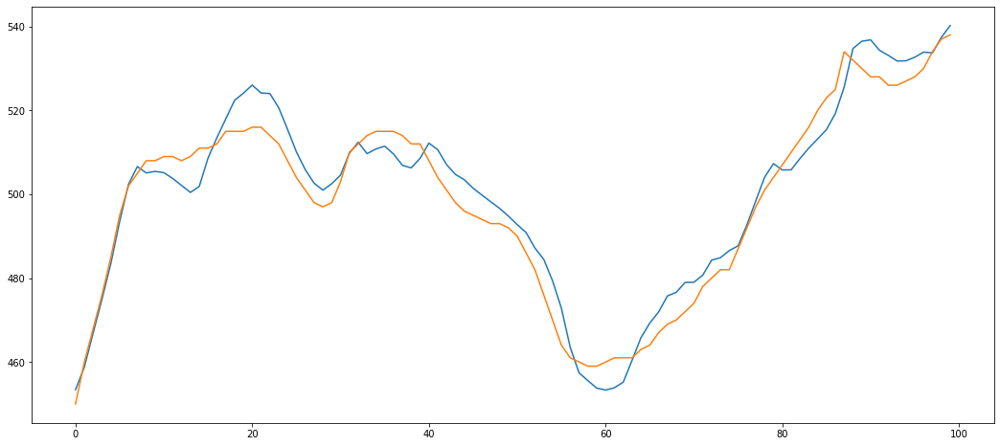

In [ ]:
df, fig = plot_predictions(model, X2_test, y2_test)

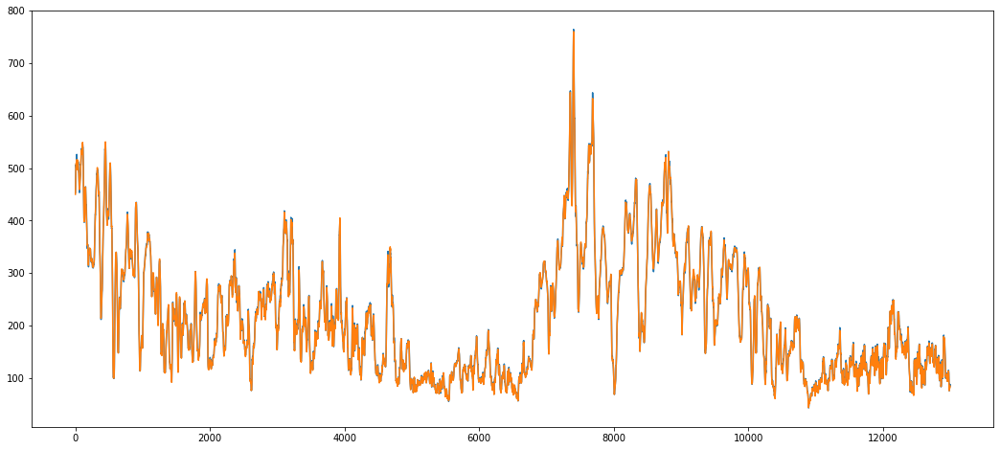

In [ ]:
df, fig = plot_predictions(model, X2_test, y2_test, end = 13000)

In [ ]:
df.head()

,Predictions,Actuals
0,453.383728,450.0
1,458.808929,460.0
2,466.964142,468.0
3,475.020264,476.0
4,483.491028,485.0


In [ ]:
# Evaluating the model

evaluate_forecast(df['Actuals'], df['Predictions'])

,r2_score,mean_absolute_error,median_absolute_error,mse,msle,mape,rmse
0,0.998989,2.667251,2.031097,13.26637,0.000457,1.499465,3.642303


## LSTM

- We will use the same train test data values for the LSTM model

In [ ]:
model2 = Sequential()
model2.add(InputLayer((5, 16)))
model2.add(LSTM(64))
model2.add(Dense(8, 'relu'))
model2.add(Dense(1, 'linear'))
model2.summary()

Model: "sequential_59"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_23 (LSTM)              (None, 64)                20736     
                                                                 
 dense_74 (Dense)            (None, 8)                 520       
                                                                 
 dense_75 (Dense)            (None, 1)                 9         
                                                                 
Total params: 21,265
Trainable params: 21,265
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model2.compile(loss=MeanSquaredError(), optimizer=Adam(learning_rate=0.0001), metrics=[RootMeanSquaredError()])

In [ ]:
model2.fit(X2_train, y2_train, validation_data=(X2_val, y2_val), epochs=30)

Epoch 1/30
938/938 [==============================] - 10s 8ms/step - loss: 90129.2188 - root_mean_squared_error: 300.2153 - val_loss: 67058.8359 - val_root_mean_squared_error: 258.9572
Epoch 2/30
938/938 [==============================] - 6s 6ms/step - loss: 81517.6094 - root_mean_squared_error: 285.5129 - val_loss: 58866.3555 - val_root_mean_squared_error: 242.6239
Epoch 3/30
938/938 [==============================] - 6s 7ms/step - loss: 70544.5859 - root_mean_squared_error: 265.6023 - val_loss: 49512.2383 - val_root_mean_squared_error: 222.5135
Epoch 4/30
938/938 [==============================] - 6s 7ms/step - loss: 58795.3125 - root_mean_squared_error: 242.4774 - val_loss: 40727.8945 - val_root_mean_squared_error: 201.8115
Epoch 5/30
938/938 [==============================] - 6s 7ms/step - loss: 47579.8984 - root_mean_squared_error: 218.1282 - val_loss: 32660.9961 - val_root_mean_squared_error: 180.7235
Epoch 6/30
938/938 [==============================] - 6s 7ms/step - loss: 37016

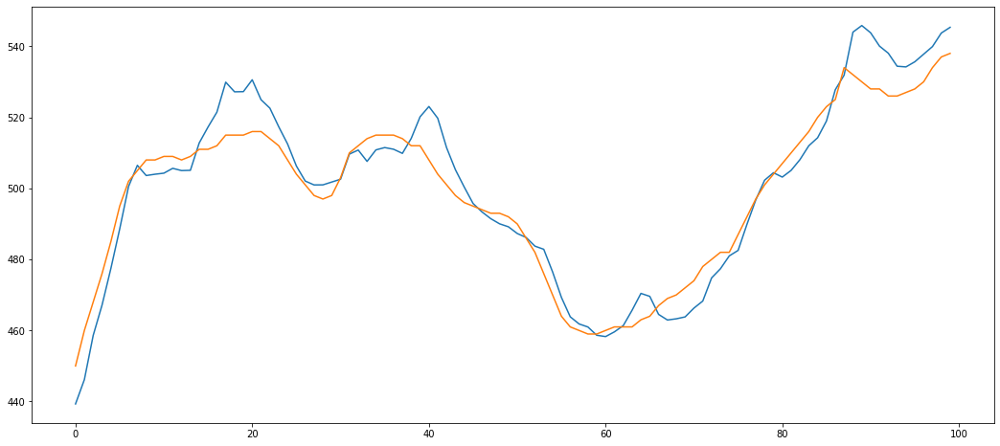

In [ ]:
df2, fig = plot_predictions(model2, X2_test, y2_test)

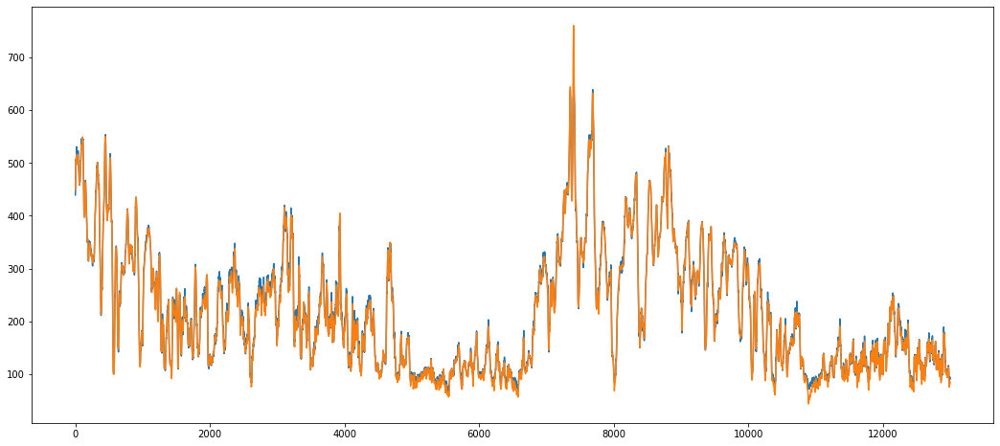

In [ ]:
df2, fig = plot_predictions(model2, X2_test, y2_test, end = 13000)

In [ ]:
# Evaluating the model

evaluate_forecast(df2['Actuals'], df2['Predictions'])

,r2_score,mean_absolute_error,median_absolute_error,mse,msle,mape,rmse
0,0.996309,4.650987,3.267536,48.45126,0.002468,3.068429,6.960694


## LSTM 2-Layers

In [ ]:
model22 = Sequential()
model22.add(InputLayer((5, 16)))
model22.add(LSTM(32, return_sequences=True))
model22.add(LSTM(64))
model22.add(Dense(8, 'relu'))
model22.add(Dense(1, 'linear'))

model22.summary()

Model: "sequential_60"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_24 (LSTM)              (None, 5, 32)             6272      
                                                                 
 lstm_25 (LSTM)              (None, 64)                24832     
                                                                 
 dense_76 (Dense)            (None, 8)                 520       
                                                                 
 dense_77 (Dense)            (None, 1)                 9         
                                                                 
Total params: 31,633
Trainable params: 31,633
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model22.compile(loss=MeanSquaredError(), optimizer=Adam(learning_rate=0.0001), metrics=[RootMeanSquaredError()])

In [ ]:
model22.fit(X2_train, y2_train, validation_data=(X2_val, y2_val), epochs=30)

Epoch 1/30
938/938 [==============================] - 15s 11ms/step - loss: 86849.5859 - root_mean_squared_error: 294.7025 - val_loss: 63927.3789 - val_root_mean_squared_error: 252.8386
Epoch 2/30
938/938 [==============================] - 9s 10ms/step - loss: 78952.7734 - root_mean_squared_error: 280.9854 - val_loss: 57991.4570 - val_root_mean_squared_error: 240.8141
Epoch 3/30
938/938 [==============================] - 9s 10ms/step - loss: 71215.2344 - root_mean_squared_error: 266.8618 - val_loss: 51540.2500 - val_root_mean_squared_error: 227.0248
Epoch 4/30
938/938 [==============================] - 9s 10ms/step - loss: 62898.8984 - root_mean_squared_error: 250.7965 - val_loss: 44928.9336 - val_root_mean_squared_error: 211.9645
Epoch 5/30
938/938 [==============================] - 9s 10ms/step - loss: 54378.9102 - root_mean_squared_error: 233.1929 - val_loss: 38478.9102 - val_root_mean_squared_error: 196.1604
Epoch 6/30
938/938 [==============================] - 9s 10ms/step - loss:

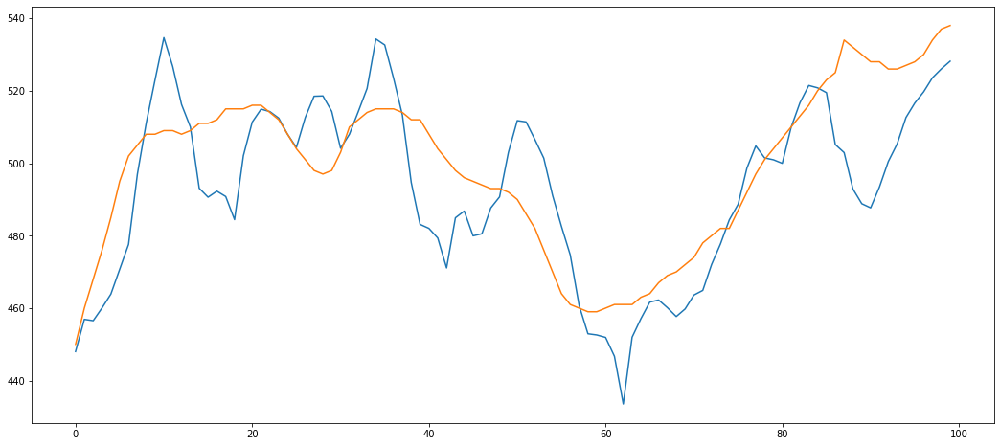

In [ ]:
df22, fig = plot_predictions(model22, X2_test, y2_test)

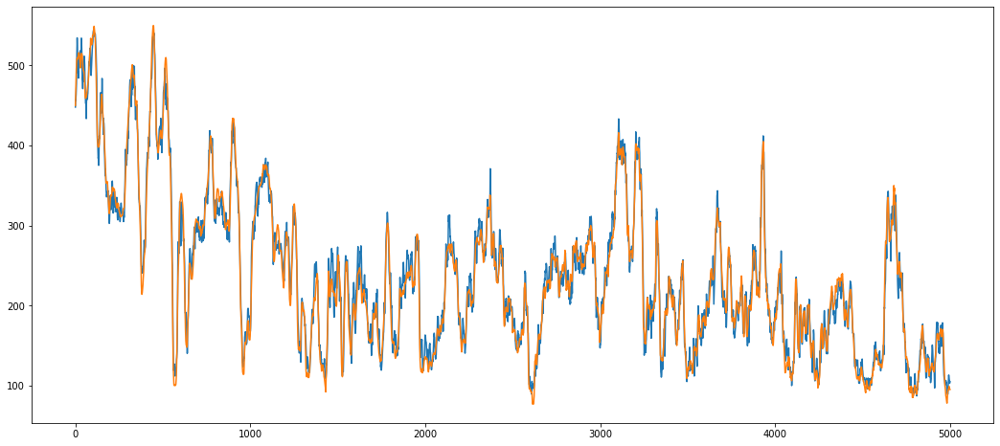

In [ ]:
df22, fig = plot_predictions(model22, X2_test, y2_test, end = 5000)

In [ ]:
# Evaluating the model

evaluate_forecast(df22['Actuals'], df22['Predictions'])

,r2_score,mean_absolute_error,median_absolute_error,mse,msle,mape,rmse
0,0.979224,11.835542,9.729752,272.739417,0.00758,6.700054,16.514824


## GRU

In [ ]:
model3 = Sequential()
model3.add(InputLayer((5, 16)))
model3.add(GRU(64))
model3.add(Dense(8, 'relu'))
model3.add(Dense(1, 'linear'))

model3.summary()

Model: "sequential_61"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_33 (GRU)                (None, 64)                15744     
                                                                 
 dense_78 (Dense)            (None, 8)                 520       
                                                                 
 dense_79 (Dense)            (None, 1)                 9         
                                                                 
Total params: 16,273
Trainable params: 16,273
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model3.compile(loss=MeanSquaredError(), optimizer=Adam(learning_rate=0.0001), metrics=[RootMeanSquaredError()])

In [ ]:
model3.fit(X2_train, y2_train, validation_data=(X2_val, y2_val), epochs=30)

Epoch 1/30
938/938 [==============================] - 9s 7ms/step - loss: 89534.4297 - root_mean_squared_error: 299.2231 - val_loss: 65865.8594 - val_root_mean_squared_error: 256.6435
Epoch 2/30
938/938 [==============================] - 6s 6ms/step - loss: 79914.4766 - root_mean_squared_error: 282.6915 - val_loss: 57429.5547 - val_root_mean_squared_error: 239.6446
Epoch 3/30
938/938 [==============================] - 6s 6ms/step - loss: 68568.2812 - root_mean_squared_error: 261.8555 - val_loss: 47681.6211 - val_root_mean_squared_error: 218.3612
Epoch 4/30
938/938 [==============================] - 6s 6ms/step - loss: 56000.6055 - root_mean_squared_error: 236.6445 - val_loss: 38403.5469 - val_root_mean_squared_error: 195.9682
Epoch 5/30
938/938 [==============================] - 6s 6ms/step - loss: 44131.5938 - root_mean_squared_error: 210.0752 - val_loss: 30047.7734 - val_root_mean_squared_error: 173.3429
Epoch 6/30
938/938 [==============================] - 6s 6ms/step - loss: 33131.

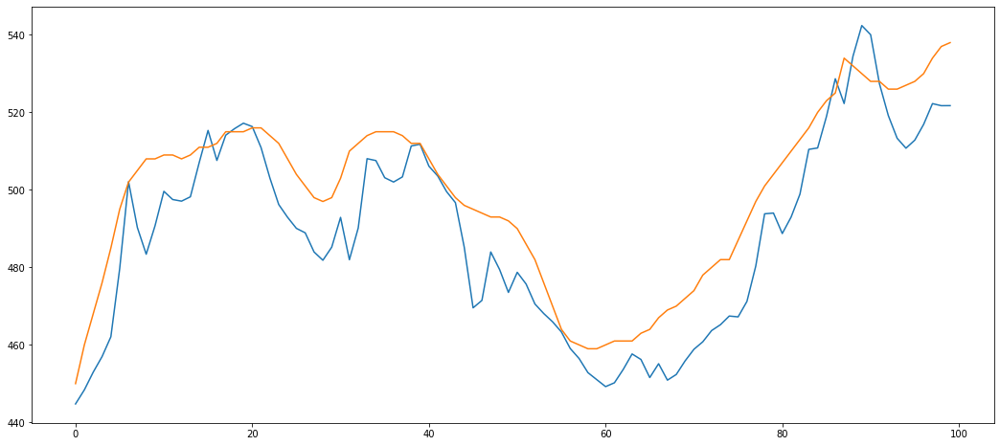

In [ ]:
df3, fig = plot_predictions(model3, X2_test, y2_test)

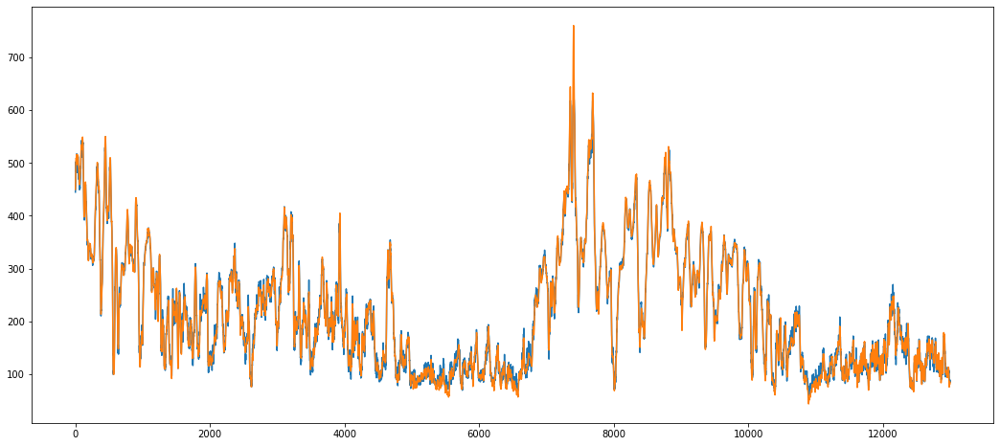

In [ ]:
df3, fig = plot_predictions(model3, X2_test, y2_test, end = 13000)

In [ ]:
# Evaluating the model

df3 = df3[df3['Predictions']>0]

evaluate_forecast(df3['Actuals'], df3['Predictions'])

,r2_score,mean_absolute_error,median_absolute_error,mse,msle,mape,rmse
0,0.993259,6.792429,5.309525,88.490493,0.003824,4.314875,9.406939


## Forecast Every polutant with 1D-CNN

### PM2.5

In [ ]:
# Defining the model

modelr = Sequential()
modelr.add(InputLayer((5, 16)))
modelr.add(Conv1D(64, kernel_size=2))
modelr.add(Flatten())
modelr.add(Dense(8, 'relu'))
modelr.add(Dense(1, 'linear'))

modelr.summary()

Model: "sequential_64"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_40 (Conv1D)          (None, 4, 64)             2112      
                                                                 
 flatten_22 (Flatten)        (None, 256)               0         
                                                                 
 dense_84 (Dense)            (None, 8)                 2056      
                                                                 
 dense_85 (Dense)            (None, 1)                 9         
                                                                 
Total params: 4,177
Trainable params: 4,177
Non-trainable params: 0
_________________________________________________________________


In [ ]:
#Function to create input and output to feed the model 
#Choosing a window size of 5

def df_to_X_y2(df, window_size=5):
  df_as_np = df.to_numpy()
  X = []
  y = []
  for i in range(len(df_as_np)-window_size):
    row = [r for r in df_as_np[i:i+window_size]]
    X.append(row)
    label = df_as_np[i+window_size][0]
    y.append(label)
  return np.array(X), np.array(y)

In [ ]:
X2, y2 = df_to_X_y2(temp_df)
X2.shape, y2.shape

((48172, 5, 16), (48172,))

In [ ]:
#Splitting the dataframe to training, testing and validating data

X2_train, y2_train = X2[:30000], y2[:30000]
X2_val, y2_val = X2[30000:35000], y2[30000:35000]
X2_test, y2_test = X2[35000:], y2[35000:]
X2_train.shape, y2_train.shape, X2_val.shape, y2_val.shape, X2_test.shape, y2_test.shape

((30000, 5, 16), (30000,), (5000, 5, 16), (5000,), (13172, 5, 16), (13172,))

In [ ]:
modelr.compile(loss=MeanSquaredError(), optimizer=Adam(learning_rate=0.0001), metrics=[RootMeanSquaredError()])

In [ ]:
modelr.fit(X2_train, y2_train, validation_data=(X2_val, y2_val), epochs=20)

Epoch 1/20
938/938 [==============================] - 4s 3ms/step - loss: 1661.7362 - root_mean_squared_error: 40.7644 - val_loss: 575.8098 - val_root_mean_squared_error: 23.9960
Epoch 2/20
938/938 [==============================] - 3s 3ms/step - loss: 1156.5886 - root_mean_squared_error: 34.0087 - val_loss: 516.3032 - val_root_mean_squared_error: 22.7223
Epoch 3/20
938/938 [==============================] - 3s 3ms/step - loss: 1064.4659 - root_mean_squared_error: 32.6262 - val_loss: 334.9844 - val_root_mean_squared_error: 18.3026
Epoch 4/20
938/938 [==============================] - 3s 3ms/step - loss: 1027.8677 - root_mean_squared_error: 32.0604 - val_loss: 275.0648 - val_root_mean_squared_error: 16.5851
Epoch 5/20
938/938 [==============================] - 3s 3ms/step - loss: 1015.1104 - root_mean_squared_error: 31.8608 - val_loss: 319.8026 - val_root_mean_squared_error: 17.8830
Epoch 6/20
938/938 [==============================] - 3s 3ms/step - loss: 1006.0616 - root_mean_squared_e

TypeError: ignored

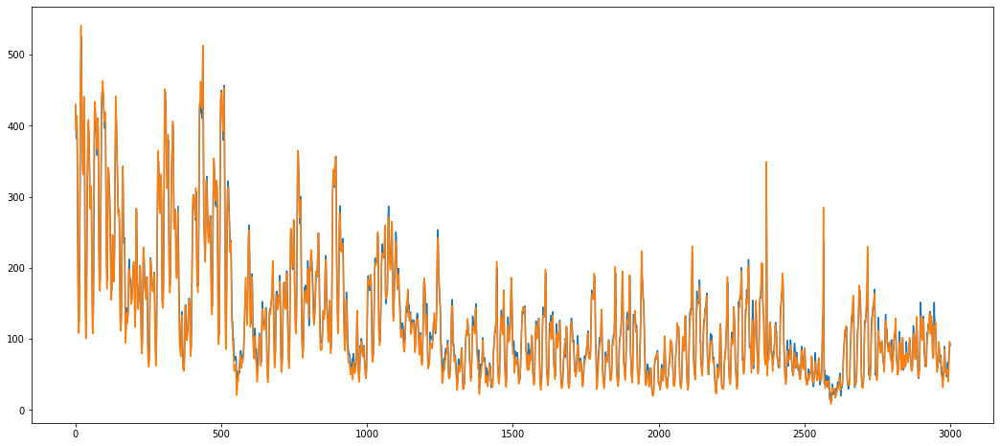

In [ ]:
df, fig = plot_predictions(modelr, X2_test, y2_test, end = 3000)

In [ ]:
# Evaluating the model

df = df[df['Predictions']>0]
evaluate_forecast(df['Actuals'], df['Predictions'])

,r2_score,mean_absolute_error,median_absolute_error,mse,msle,mape,rmse
0,0.998989,2.667251,2.031097,13.26637,0.000457,1.499465,3.642303


### PM10

In [ ]:
def df_to_X_y2(df, window_size=5):
  df_as_np = df.to_numpy()
  X = []
  y = []
  for i in range(len(df_as_np)-window_size):
    row = [r for r in df_as_np[i:i+window_size]]
    X.append(row)
    label = df_as_np[i+window_size][1]
    y.append(label)
  return np.array(X), np.array(y)

In [ ]:
X2, y2 = df_to_X_y2(temp_df)
X2.shape, y2.shape

((48172, 5, 16), (48172,))

In [ ]:
#Splitting the dataframe to training, testing and validating data

X2_train, y2_train = X2[:30000], y2[:30000]
X2_val, y2_val = X2[30000:35000], y2[30000:35000]
X2_test, y2_test = X2[35000:], y2[35000:]
X2_train.shape, y2_train.shape, X2_val.shape, y2_val.shape, X2_test.shape, y2_test.shape

((30000, 5, 16), (30000,), (5000, 5, 16), (5000,), (13172, 5, 16), (13172,))

In [ ]:
modelr.compile(loss=MeanSquaredError(), optimizer=Adam(learning_rate=0.0001), metrics=[RootMeanSquaredError()])

In [ ]:
modelr.fit(X2_train, y2_train, validation_data=(X2_val, y2_val), epochs=20)

Epoch 1/20
938/938 [==============================] - 3s 3ms/step - loss: 2637.3687 - root_mean_squared_error: 51.3553 - val_loss: 686.3136 - val_root_mean_squared_error: 26.1976
Epoch 2/20
938/938 [==============================] - 3s 3ms/step - loss: 2423.6755 - root_mean_squared_error: 49.2308 - val_loss: 769.8461 - val_root_mean_squared_error: 27.7461
Epoch 3/20
938/938 [==============================] - 3s 3ms/step - loss: 2362.2019 - root_mean_squared_error: 48.6025 - val_loss: 573.7842 - val_root_mean_squared_error: 23.9538
Epoch 4/20
938/938 [==============================] - 3s 3ms/step - loss: 2337.5925 - root_mean_squared_error: 48.3487 - val_loss: 543.0938 - val_root_mean_squared_error: 23.3044
Epoch 5/20
938/938 [==============================] - 3s 3ms/step - loss: 2330.3159 - root_mean_squared_error: 48.2733 - val_loss: 596.6426 - val_root_mean_squared_error: 24.4263
Epoch 6/20
938/938 [==============================] - 3s 3ms/step - loss: 2320.6150 - root_mean_squared_e

TypeError: ignored

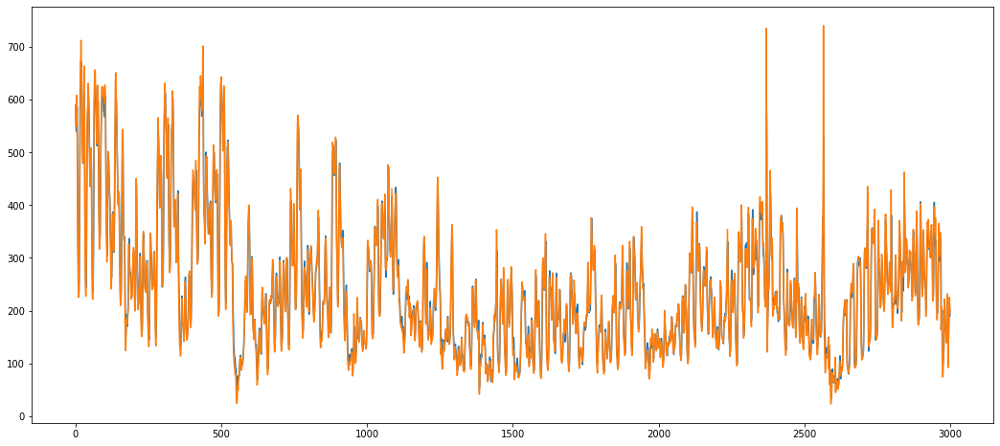

In [ ]:
df, fig = plot_predictions(modelr, X2_test, y2_test, end = 3000)

In [ ]:
# Evaluating the model

df = df[df['Predictions']>0]
evaluate_forecast(df['Actuals'], df['Predictions'])

,r2_score,mean_absolute_error,median_absolute_error,mse,msle,mape,rmse
0,0.998989,2.667251,2.031097,13.26637,0.000457,1.499465,3.642303
